## План

### Часть 1: Дополнительные "фишки" при работе с временными рядами:
  * Feature extraction, engineering, предобработка данных, какие признаки и как можно извлечь
  * Линейные модели, обучаем, смотрим качество на кросс-валидации, оцениваем важность признаков
  * Регуляризация, отбор признаков, сокращение признакового пространства, ridge, lasso
  * Бустиг для временных рядов - ограничения и преимущества
### Часть 2: Библиотеки для того, чтобы упростить себе жизнь:
  * Facebook Prophet - автоматические прогнозы

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot
sns.set()

from itertools import product
from tqdm import tqdm_notebook

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# Метрики для оценки качества работы алгоритмов для прогнозов временных рядов:
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [2]:
ads = pd.read_csv('./../data/ads.csv', index_col=['Time'], parse_dates=['Time'])
currency = pd.read_csv('./../data/currency.csv', index_col=['Time'], parse_dates=['Time'])

In [3]:
# Посмотрим (вспомним) как выглядит график временного ряда для данных по рекламе:
hvplot.plot(ads.Ads, width=800, height=400, title='Количество просмотров рекламы (часовые данные)', grid=True, kind='line', yformatter='%.0f')

:Curve   [Time]   (Ads)

In [4]:
# Посмотрим (вспомним) как выглядит график временного ряда для данных по игровым покупкам:
hvplot.plot(currency.GEMS_GEMS_SPENT, width=800, height=400, title='Количество внутриигровых покупок (дневные данные)', grid=True, kind='line', yformatter='%.0f')

:Curve   [Time]   (GEMS_GEMS_SPENT)

# 1) Оптимальный Machine Learning для временных рядов на практике:

### Временные ряды - прогнозируем, чем можем

Часто на работе приходится строить модели, руководствуясь одним основополагающим принципом – __быстро, качественно, недорого.__ Поэтому часть моделей могут банально не подойти для "продакшн-решений" и "пост-продакшн" работы, так как либо требуют слишком больших затрат по подготовке данных, либо сложно настраиваются, либо требуют частого переобучения на новых данных, либо компания бедна чтобы приобрести ресурсы для своей же работы, поэтому зачастую гораздо проще бывает выделить несколько признаков из имеющегося временного ряда и построить по ним обычную линейную регрессию или навесить решаюший лес. Дешево и сердито и без лишней головной боли.


Возможно, этот подход не является значительно подкрепленным теорией, нарушает различные предпосылки, например, условия Гаусса-Маркова, особенно пункт про некоррелированность ошибок/остатков, однако на практике нередко выручает и достаточно активно используется в соревнованиях по машинному обучению.

### _Извлечение признаков (Feature exctraction for Time Series Data)_

Для модели нужны признаки, а у нас есть только одномерный временной ряд, что можно придумать?

* Конечно же, лаги временного ряда
* Статистики по окнам:
    - Минимальное/максимальное значение ряда в выбранном временном окне
    - Среднеё/медианное значение по временному окну
    - Дисперсия по временному окну
    - и т.д. (например какие-либо тесты, так тоже иногда делают).
* Признаки из самой даты и времени:
    - Минута часа, час дня, день недели, месяц года и т.д.
    - Является ли день праздником/выходным/специфическим днём
    - Является ли год высокосным или нет, была ли война либо нет, был ли кризис либо нет и т.д.
* Кодирование средним
* Прогнозы других моделей (но тут в скорости можно потерять) - стекинг/ансамбли моделей

Пройдемся по некоторым из способов и посмотрим, что мы можем вытащить из нашего временного ряда с рекламой

### _Лаги временного ряда_

Сдвигая ряд на $\tau$ шагов мы получаем столбец-признак, в котором текущему значению ряда в момент $t$ будет соответствовать его значение в момент времени $t-n$. Таким образом, если сделать отступ в 1 шаг, то модель, обученная на таком признаке, будет способна давать предсказание на 1 шаг вперед, зная текущее состояние ряда. Увеличивая сдвиг, например, до 6 лага позволит модели делать предсказания на 6 шагов вперёд, однако опираться она будет на данные, которые видела 6 временных периодов назад и если за это время что-то кардинально поменялось, модель сразу не уловит изменений и выдаст прогноз с большой ошибкой. Поэтому при выборе начального лага приходиться балансировать между желанием получить предсказания на бОльшее число периодов вперёд и приемлимым качеством предсказания

In [5]:
# Создадим копию изначального датасета для того чтобы покрутить его в разные стороны без изменений в основном датафрейме (я сделал для себя чтобы мне было удобно эксперементировать с рядом)
data = pd.DataFrame(ads.Ads.copy())
data.columns = ["y"]

In [6]:
data.head()

,y
Time,
2021-09-13 00:00:00,80115
2021-09-13 01:00:00,79885
2021-09-13 02:00:00,89325
2021-09-13 03:00:00,101930
2021-09-13 04:00:00,121630


In [7]:
# Добавим лаги временного ряда для целевой переменной начиная с 6 заканчивая 24
for i in range(6, 25):
    data["lag_{}".format(i)] = data.y.shift(i)

In [8]:
# Посмотрим что получилось:
data.tail(7)

,y,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,lag_13,lag_14,lag_15,lag_16,lag_17,lag_18,lag_19,lag_20,lag_21,lag_22,lag_23,lag_24
Time,,,,,,,,,,,,,,,,,,,,
2021-09-21 17:00:00,151790,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0,123945.0,142425.0,146215.0,139515.0
2021-09-21 18:00:00,155665,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0,123945.0,142425.0,146215.0
2021-09-21 19:00:00,155890,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0,123945.0,142425.0
2021-09-21 20:00:00,123395,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0,123945.0
2021-09-21 21:00:00,103080,146020.0,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0
2021-09-21 22:00:00,95155,152120.0,146020.0,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0
2021-09-21 23:00:00,80285,151790.0,152120.0,146020.0,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0


Шикарно, у нас есть датасет, почему бы не построить модель!

In [9]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score, TimeSeriesSplit

# time-series cross-validation --> 5 folds
tscv = TimeSeriesSplit(n_splits=5)

In [10]:
def timeseries_train_test_split(X, y, test_size):
    test_index = int(len(X)*(1-test_size))
    
    X_train = X.iloc[:test_index-1]
    y_train = y.iloc[:test_index-1]

    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]
    
    return X_train, X_test, y_train, y_test

In [11]:
y = data.dropna().y
X = data.dropna().drop(['y'], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

In [12]:
# machine learning in two lines
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [13]:
def plotModelResults(model, X_train=X_train, X_test=X_test, plot_intervals=False, plot_anomalies=False):

    prediction = model.predict(X_test)
    
    plt.figure(figsize=(15, 7))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    
    if plot_intervals:
        cv = cross_val_score(model, X_train, y_train, 
                                    cv=tscv, 
                                    scoring="neg_mean_absolute_error")
        mae = cv.mean() * (-1)
        deviation = cv.std()
        
        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)
        
        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)
        
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True);
    
def plotCoefficients(model):

    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind='bar')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');

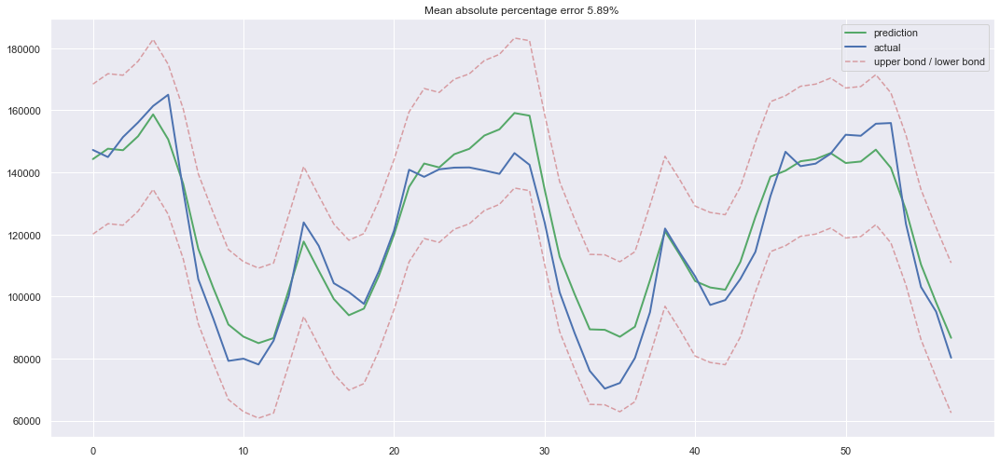

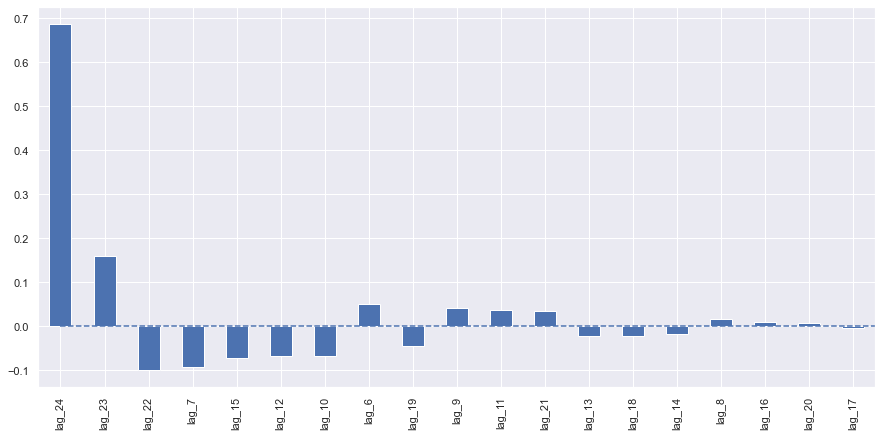

In [14]:
plotModelResults(lr, plot_intervals=True)
plotCoefficients(lr)

Что ж, всего лишь простыми лагами удалось построить модель, которая не сильно уступает по качеству SARIMA модели. Пока что в модели есть достаточно много мусорных факторов, но отбором займемся чуть позже, а пока продолжим придумывать признаки!

Добавим в датасет час, день недели и выходной в качестве категориальных переменных. Для этого переводим имеющийся в датафрейме индекс в формат `datetime`, и извлекаем из него `hour` и `weekday`.

In [15]:
data.index = pd.to_datetime(data.index)
data["hour"] = data.index.hour
data["weekday"] = data.index.weekday
data['is_weekend'] = data.weekday.isin([5,6])*1
data.tail()

,y,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,lag_13,lag_14,...,lag_18,lag_19,lag_20,lag_21,lag_22,lag_23,lag_24,hour,weekday,is_weekend
Time,,,,,,,,,,,,,,,,,,,,,
2021-09-21 19:00:00,155890,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,...,72150.0,70335.0,76050.0,88170.0,101360.0,123945.0,142425.0,19,1,0
2021-09-21 20:00:00,123395,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,...,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0,123945.0,20,1,0
2021-09-21 21:00:00,103080,146020.0,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,...,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0,21,1,0
2021-09-21 22:00:00,95155,152120.0,146020.0,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,...,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,22,1,0
2021-09-21 23:00:00,80285,151790.0,152120.0,146020.0,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,...,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,23,1,0


Можно визуализировать получившиеся признаки

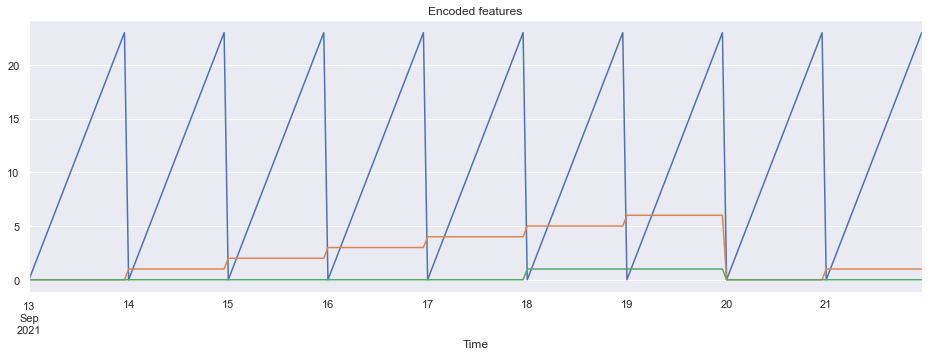

In [16]:
plt.figure(figsize=(16, 5))
plt.title("Encoded features")
data.hour.plot()
data.weekday.plot()
data.is_weekend.plot()
plt.grid(True);

Так как теперь у нас данные в разном масштабе - десятки тысяч в лагах и единицы в категориях, имеет смысл привести всё к одному масштабу, чтобы можно было по-прежнему исследовать коэффициенты модели. Для этого воспользуемся `StandardScaler`

Также, раз мы работаем с линейной моделью, имеет смысл преобразовать категориальные переменные в дамми

In [17]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

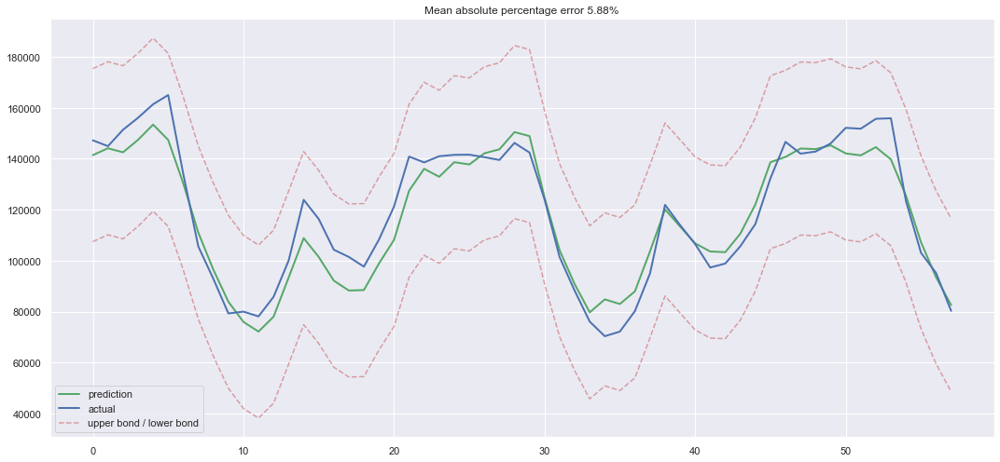

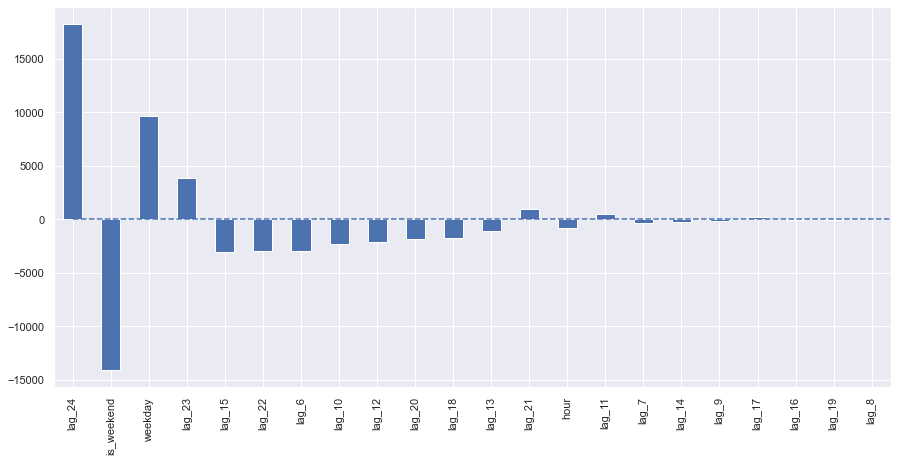

In [18]:
y = data.dropna().y
X = data.dropna().drop(['y'], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True)
plotCoefficients(lr)

По коэффициентам видно, что день недели и выходной - довольно неплохие признаки

### _Кодирование средним (target encoding):_

Иногда в качестве признака добавлять среднее значение целевой переменной. В нашем случае каждый день недели или час дня можно закодировать сооветствующим средним числом просмотров рекламы/траты игровой валюты, пришедшиеся на этот день недели или этот час. При этом важно следить за тем, чтобы расчет среднего значения производился только в рамках тренировочного датасета (или в рамках текущего наблюдаемого фолда при кросс-валидации), иначе можно ненароком привнести в модель информацию о будущем.

In [19]:
def code_mean(data, cat_feature, real_feature):
    return dict(data.groupby(cat_feature)[real_feature].mean())

Посмотрим на средние по часам

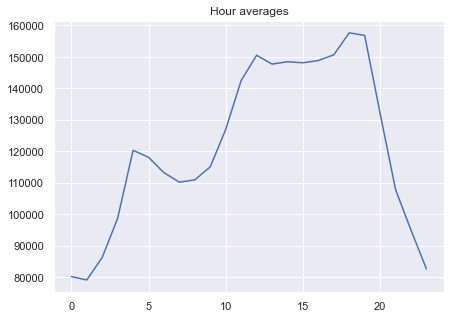

In [20]:
average_hour = code_mean(data, 'hour', "y")
plt.figure(figsize=(7, 5))
plt.title("Hour averages")
pd.DataFrame.from_dict(average_hour, orient='index')[0].plot()
plt.grid(True);

А теперь, объединим все преобразования под одной функцией и добавим к признакам кодирование средним

In [21]:
def prepareData(series, lag_start, lag_end, test_size, target_encoding=False, get_dummies=False):
    """
        series: pd.DataFrame
            dataframe with timeseries

        lag_start: int
            initial step back in time to slice target variable 
            example - lag_start = 1 means that the model 
                      will see yesterday's values to predict today

        lag_end: int
            final step back in time to slice target variable
            example - lag_end = 4 means that the model 
                      will see up to 4 days back in time to predict today

        test_size: float
            size of the test dataset after train/test split as percentage of dataset

        target_encoding: boolean
            if True - add target averages to the dataset
            
        get_dummies: boolean
            if True - encode categorical into dummies
        
    """
    
    # copy of the initial dataset
    data = pd.DataFrame(series.copy())
    data.columns = ["y"]
    
    # lags of series
    for i in range(lag_start, lag_end):
        data["lag_{}".format(i)] = data.y.shift(i)
    
    # datetime features
    data.index = pd.to_datetime(data.index)
    data["hour"] = data.index.hour
    data["weekday"] = data.index.weekday
    data['is_weekend'] = data.weekday.isin([5,6])*1
    
    if target_encoding:
        # calculate averages on train set only
        test_index = int(len(data.dropna())*(1-test_size))
        data['weekday_average'] = list(map(code_mean(data[:test_index], 'weekday', "y").get, data.weekday))
        data["hour_average"] = list(map(code_mean(data[:test_index], 'hour', "y").get, data.hour))

        # drop encoded variables 
        data.drop(["hour", "weekday"], axis=1, inplace=True)
        
    if get_dummies:
        data = pd.get_dummies(data, columns=['hour', 'weekday'])
    
    # train-test split
    y = data.dropna().y
    X = data.dropna().drop(['y'], axis=1)
    X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=test_size)

    return X_train, X_test, y_train, y_test

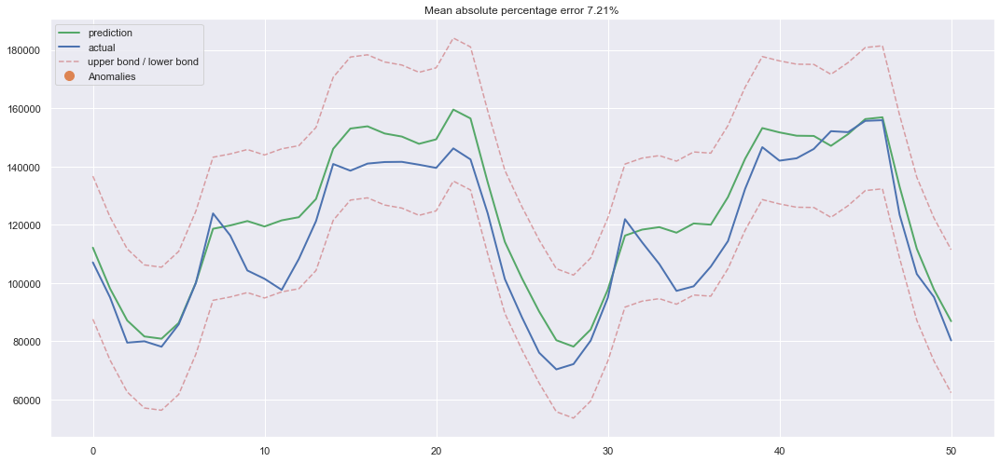

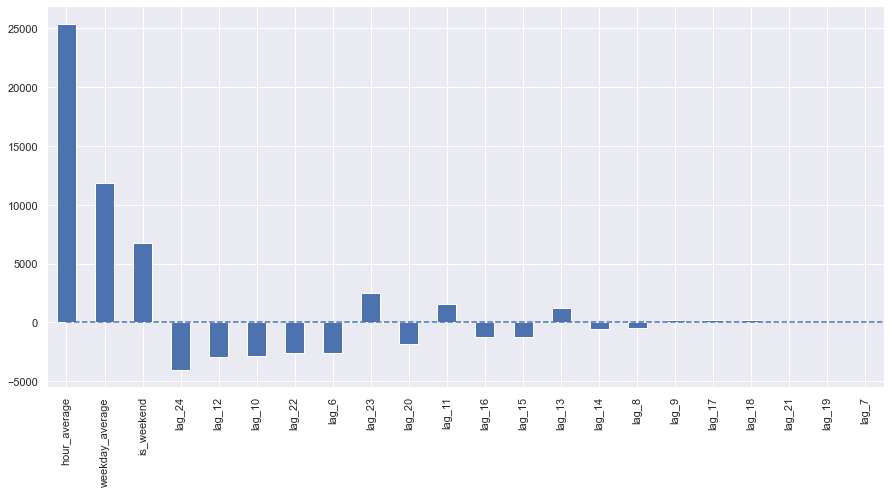

In [22]:
X_train, X_test, y_train, y_test = prepareData(ads.Ads, lag_start=6, lag_end=25, test_size=0.3, target_encoding=True)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True, plot_anomalies=True)
plotCoefficients(lr)

А вот и немного переобучения, переменная hour_average настолько понравилась нашей модели на тренировочном датасете, что по ней, в основном, модель и стала прогнозировать. Решить эту проблему можно по-разному, например, считать средние таргета не по всему тренировочному датасету, а по некоторому последнему окну, которое будет лучше отражать последующее состояние ряда. Можно и просто руками выкинуть эту переменную, раз мы уверены, что она ведёт к ухудшению качества, что мы сейчас и сделаем.

Также дополнительно сделаем еще одно преобразование - сделаем из категориальных переменных дамми-столбцы. Раз уж мы работаем с линейными моделями, имеет смысл разбить наши переменные "weekday" и "hour" на независимые столбцы, иначе получается нехорошая ситуация, когда 23-й час находится гораздо дальше от 1-го, чем от, например, 19-го. (Есть огромное количество и других методов работы с цикличными данными, такими как дни недели, часы в сутках или минуты в часах - например, можно [кодировать их при помощи синусов и косинусов](https://ianlondon.github.io/blog/encoding-cyclical-features-24hour-time/)

In [23]:
X_train, X_test, y_train, y_test = prepareData(ads.Ads, lag_start=6, lag_end=25, test_size=0.3, target_encoding=False, get_dummies=True)

column_to_scale = [col for col in X_train.columns if 'lag' in col]
X_train_scaled = scaler.fit_transform(X_train[column_to_scale])
X_test_scaled = scaler.transform(X_test[column_to_scale])

X_train[column_to_scale] = X_train_scaled
X_test[column_to_scale] = X_test_scaled

## Регуляризация и отбор признаков

Как мы уже выяснили, не все признаки одинаково полезны, а некоторые даже вредны и от них нужно срочно избавляться. Помимо выкидывания руками некоторых признаков, можно заняться регуляризацией. Сейчас мы рассмотрим две наиболее распространенных модели с регуляризацией - ридж и лассо регрессии. Они добавляют к нашей функции потерь, при помощи которой мы оптимизируем значения коэффициентов модели, еще немножко ограничений. 

В случае с ридж регрессией - это сумма квадратов коэффициентов модели, помноженная на коэффициент регуляризации. Т.е. чем больше значение коэффициента у переменной, тем больше будет наша ошибка, а значит, мы будем стараться оптимизировать одновременно как подгонку модели под данные, так и не давать коэффициентам сильно разрастаться. 

В результате такой регуляризации, которая носит название $L2$, мы получаем бОльшее смещение, но меньший разброс, т.е. модель будет (по крайней мере мы на это очень надеемся) обладать лучшей обобщающей способностью.

Вторая модель - лассо регрессия, в ней к функционалу ошибки добавляются не квадраты, а модули коэффициентов, в результате чего во время оптимизации коэффициенты перед факторами, которые оказываются не так важны, просто зануляются. Такой тип регуляризации называется $L1$. Таким образом, лассо регрессия автоматически позволяет производить отбор факторов для модели, сокращая признаковое пространство.

Для начала убедимся, что нам есть, что отбрасывать и в данных действительно очень много скоррелированных признаков

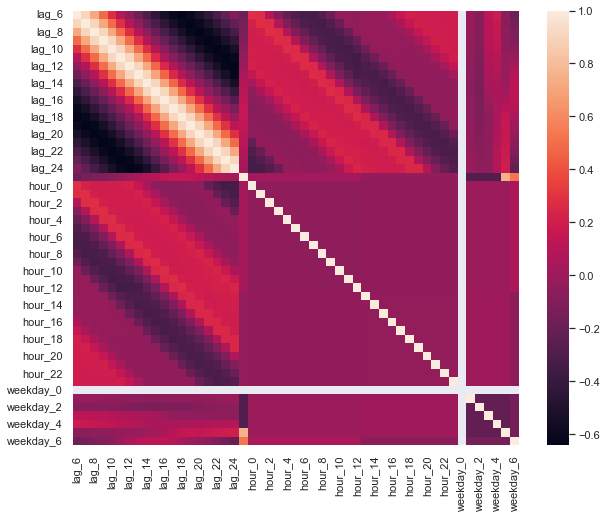

In [24]:
plt.figure(figsize=(10, 8))
sns.heatmap(X_train.corr());

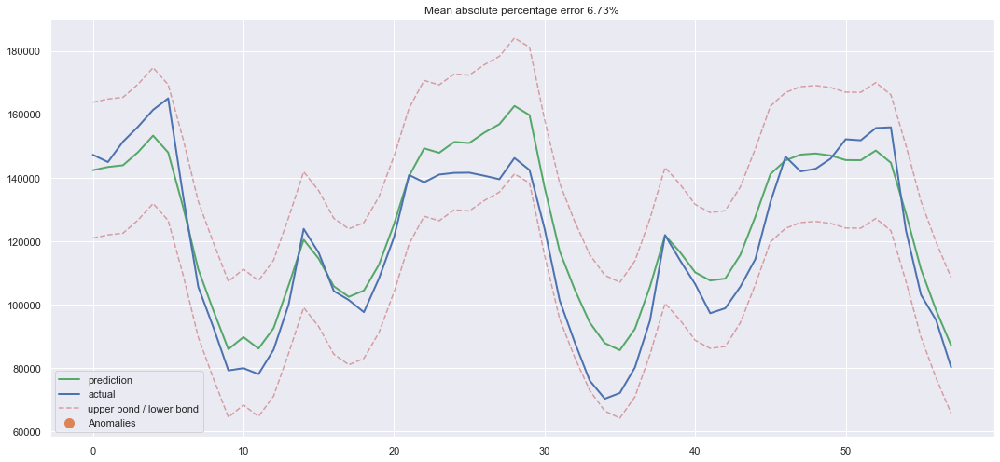

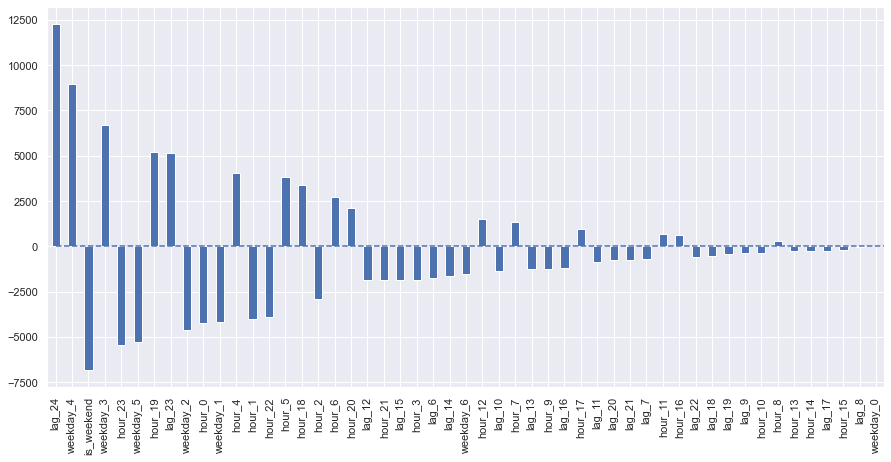

In [25]:
from sklearn.linear_model import LassoCV, RidgeCV

ridge = RidgeCV(cv=tscv, alphas=np.linspace(5, 10))
ridge.fit(X_train, y_train)

plotModelResults(ridge, 
                 X_train=X_train, 
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(ridge)

Хорошо видно, как всё ближе и ближе прижимаются к нулю (хотя никогда нулю не равны) коэффициенты в модели по мере убывания их важности. 

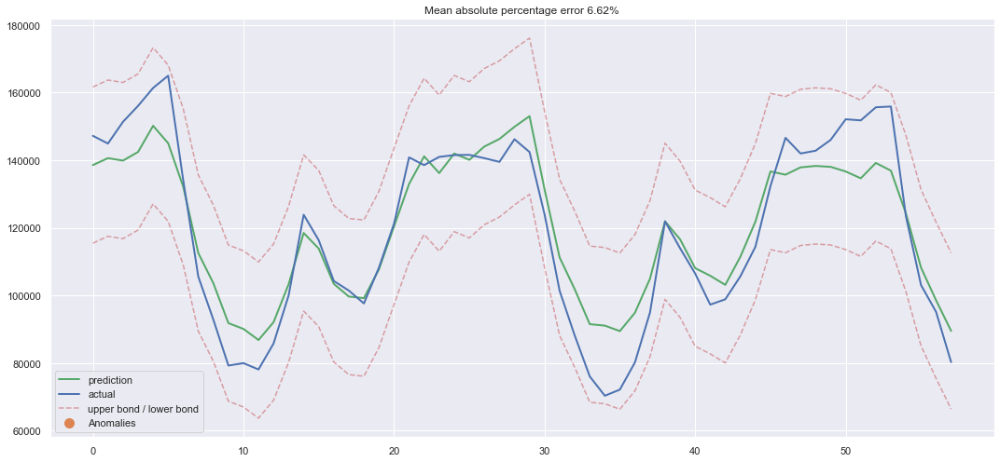

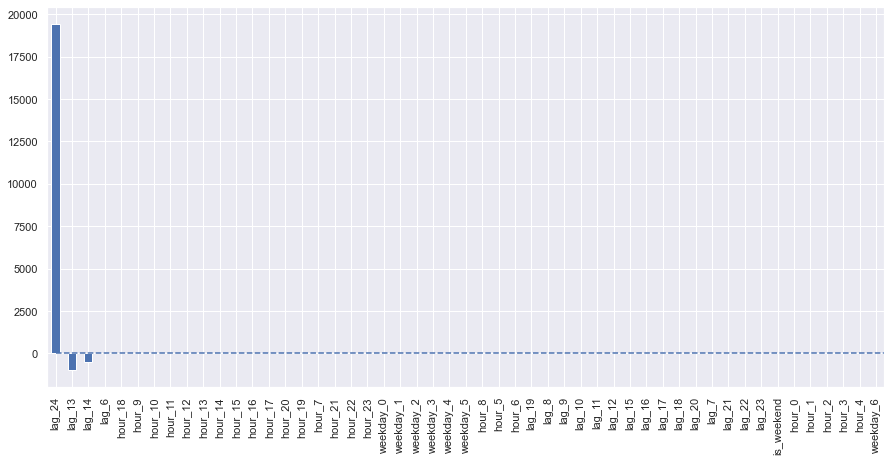

In [26]:
lasso = LassoCV(cv=tscv, eps=0.01)
lasso.fit(X_train, y_train)

plotModelResults(lasso, 
                 X_train=X_train, 
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(lasso)

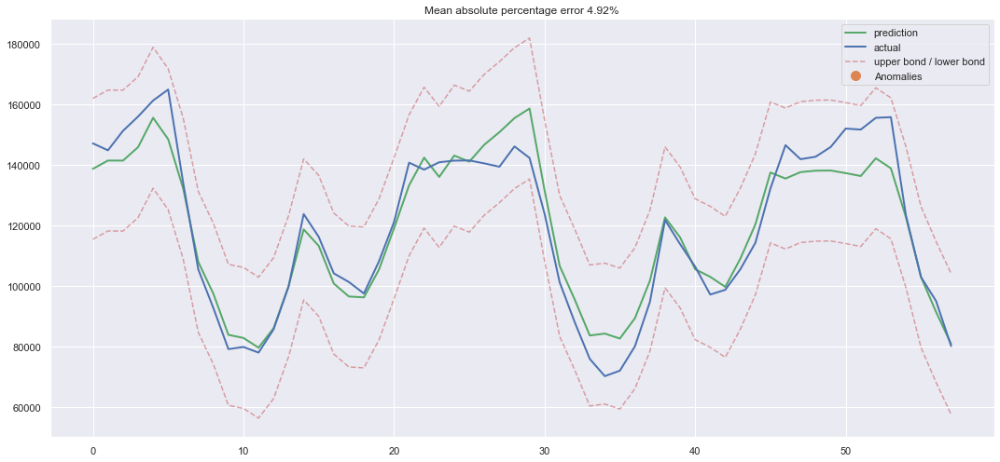

In [28]:
lr.fit(X_train[['lag_24']], y_train)

plotModelResults(lr, X_train=X_train[['lag_24']],
                 X_test=X_test[['lag_24']],
                 plot_anomalies=True, plot_intervals=True)

Лассо регрессия оказалась более консервативой и убрала 23-й лаг из важных факторов модели, что, в результате, только пошло на пользу качеству на отложенной выборке.

## Boosting

Почему бы теперь не попробовать бустинг?
<img src="https://habrastorage.org/files/754/a9a/26e/754a9a26e59648de9fe2487241a27c43.jpg"/>

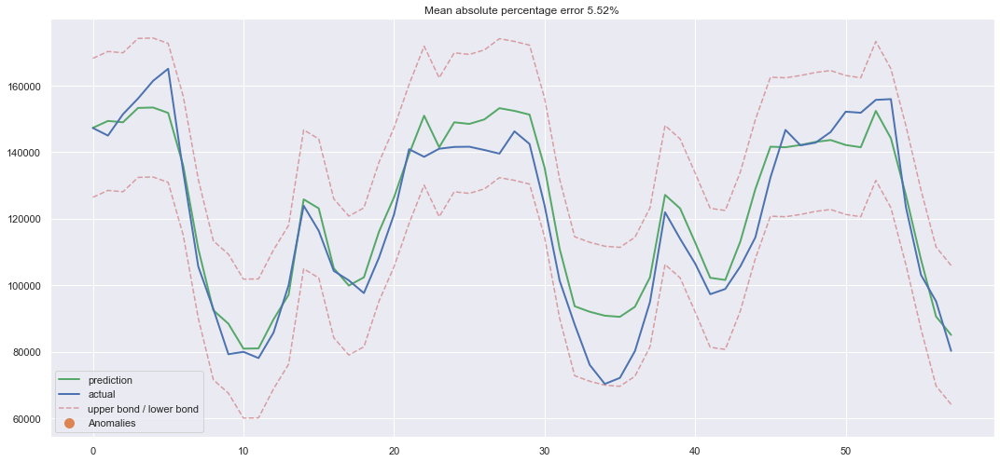

In [30]:
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor

gbr = AdaBoostRegressor(n_estimators=100)
gbr.fit(X_train_scaled, y_train)

plotModelResults(gbr, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 plot_intervals=True, plot_anomalies=True)

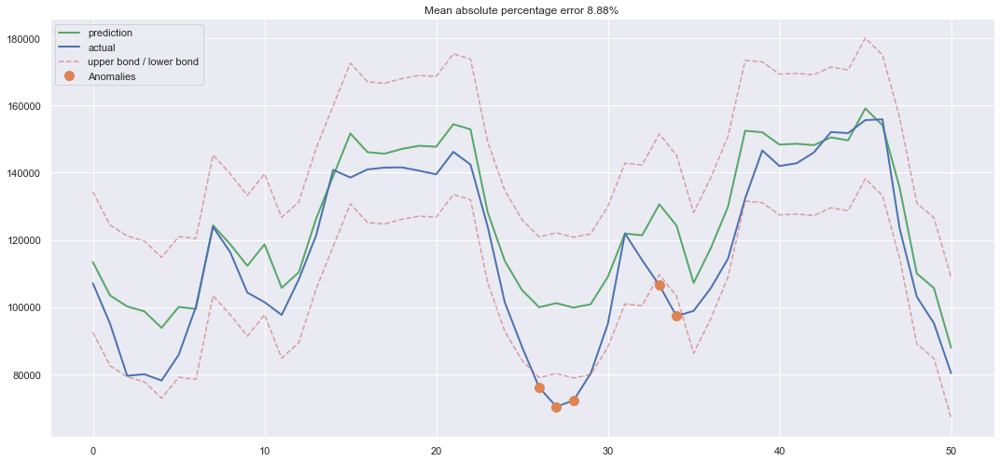

In [31]:
from catboost import CatBoostRegressor

X_train, X_test, y_train, y_test = prepareData(ads.Ads, lag_start=6, lag_end=25, test_size=0.3, target_encoding=True)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


catboost = CatBoostRegressor(iterations=100, learning_rate=0.7,
                          loss_function='RMSE', verbose=0)

catboost.fit(X_train_scaled, y_train, verbose=0)

plotModelResults(catboost, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 plot_intervals=True, plot_anomalies=True)

Не стоит первым делом при работе с временным рядом расчехлять xgboost. Дело в том, что модели с деревьями внутри, в отличие от линейных, довольно плохо справляются с трендами без помощи трюков с обработкой данных. В идеале - предварительно очистить данные от тренда, спрогнозировать тренд отдельно при помощи линейной модели, и отдельно - очищенный ряд, а потом сложить вместе предсказания.

# Часть 2: Библиотеки для того, чтобы упростить себе жизнь

## Facebook Prophet - automating routines

![](https://miro.medium.com/max/1060/0*tVCene42rgUTNv9Q.png)

https://github.com/facebook/prophet

[Предсказываем будущее с помощью библиотеки Facebook Prophet](https://facebook.github.io/prophet/docs/quick_start.html)

Библиотека prophet позволяет быстро и достаточно качественно автоматически строить прогнозы временныз рядов. Подробно про теорию работы можно почитать в замечательной документации по ссылке выше, а сейчас посмотрим на практике, как она работает

In [32]:
from prophet import Prophet

In [33]:
# number of future predictions
predictions = 60

# creating a specific format dataset 
df = ads.reset_index()
df.columns = ['ds', 'y']
df.tail()

,ds,y
211,2021-09-21 19:00:00,155890
212,2021-09-21 20:00:00,123395
213,2021-09-21 21:00:00,103080
214,2021-09-21 22:00:00,95155
215,2021-09-21 23:00:00,80285


In [34]:
# reserve some data for testing
train_df = df[:-predictions]

In [35]:
# declaring the model, it's necessary to pay attention to seasonality type we want to use
model = Prophet(weekly_seasonality=True, yearly_seasonality=False)
model.fit(train_df)

# creating one more specific dataset for predictions
# we also need to set data frequency here (by default - days)
future = model.make_future_dataframe(periods=predictions, freq='H')
future.tail()

20:46:56 - cmdstanpy - INFO - Chain [1] start processing
20:46:56 - cmdstanpy - INFO - Chain [1] done processing


,ds
211,2021-09-21 19:00:00
212,2021-09-21 20:00:00
213,2021-09-21 21:00:00
214,2021-09-21 22:00:00
215,2021-09-21 23:00:00


In [36]:
# finally, making predictions
forecast = model.predict(future)
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
211,2021-09-21 19:00:00,128042.047680,141434.450563,163271.579855,128039.865468,128044.113689,24247.842773,24247.842773,24247.842773,27776.925634,27776.925634,27776.925634,-3529.082861,-3529.082861,-3529.082861,0.0,0.0,0.0,152289.890453
212,2021-09-21 20:00:00,128077.028104,125169.176313,146915.802192,128074.776092,128079.140653,7941.200324,7941.200324,7941.200324,11519.622805,11519.622805,11519.622805,-3578.422481,-3578.422481,-3578.422481,0.0,0.0,0.0,136018.228428
213,2021-09-21 21:00:00,128112.008528,104440.795768,126159.343637,128109.698316,128114.201511,-12766.400685,-12766.400685,-12766.400685,-9166.345634,-9166.345634,-9166.345634,-3600.055051,-3600.055051,-3600.055051,0.0,0.0,0.0,115345.607844
214,2021-09-21 22:00:00,128146.988952,85630.470794,107020.503744,128144.613751,128149.268606,-31427.143700,-31427.143700,-31427.143700,-27832.916392,-27832.916392,-27832.916392,-3594.227307,-3594.227307,-3594.227307,0.0,0.0,0.0,96719.845253
215,2021-09-21 23:00:00,128181.969376,74056.569857,96371.907076,128179.533872,128184.276321,-43673.600189,-43673.600189,-43673.600189,-40112.223620,-40112.223620,-40112.223620,-3561.376569,-3561.376569,-3561.376569,0.0,0.0,0.0,84508.369188


In [39]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-09-13 00:00:00,120638.684300,65072.297315,86307.390416,120638.684300,120638.684300,-45336.555108,-45336.555108,-45336.555108,-44666.302240,-44666.302240,-44666.302240,-670.252868,-670.252868,-670.252868,0.0,0.0,0.0,75302.129192
1,2021-09-13 01:00:00,120673.990726,67049.208037,89801.983507,120673.990726,120673.990726,-42152.308565,-42152.308565,-42152.308565,-42016.870745,-42016.870745,-42016.870745,-135.437819,-135.437819,-135.437819,0.0,0.0,0.0,78521.682161
2,2021-09-13 02:00:00,120709.297151,76736.781592,97941.963154,120709.297151,120709.297151,-33135.778036,-33135.778036,-33135.778036,-33504.341249,-33504.341249,-33504.341249,368.563212,368.563212,368.563212,0.0,0.0,0.0,87573.519115
3,2021-09-13 03:00:00,120744.603577,89211.642974,110186.303006,120744.603577,120744.603577,-20739.316881,-20739.316881,-20739.316881,-21577.923650,-21577.923650,-21577.923650,838.606768,838.606768,838.606768,0.0,0.0,0.0,100005.286696
4,2021-09-13 04:00:00,120779.910003,100375.496499,122637.192698,120779.910003,120779.910003,-9006.757435,-9006.757435,-9006.757435,-10278.656214,-10278.656214,-10278.656214,1271.898779,1271.898779,1271.898779,0.0,0.0,0.0,111773.152568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,2021-09-21 19:00:00,128042.047680,141434.450563,163271.579855,128039.865468,128044.113689,24247.842773,24247.842773,24247.842773,27776.925634,27776.925634,27776.925634,-3529.082861,-3529.082861,-3529.082861,0.0,0.0,0.0,152289.890453
212,2021-09-21 20:00:00,128077.028104,125169.176313,146915.802192,128074.776092,128079.140653,7941.200324,7941.200324,7941.200324,11519.622805,11519.622805,11519.622805,-3578.422481,-3578.422481,-3578.422481,0.0,0.0,0.0,136018.228428
213,2021-09-21 21:00:00,128112.008528,104440.795768,126159.343637,128109.698316,128114.201511,-12766.400685,-12766.400685,-12766.400685,-9166.345634,-9166.345634,-9166.345634,-3600.055051,-3600.055051,-3600.055051,0.0,0.0,0.0,115345.607844
214,2021-09-21 22:00:00,128146.988952,85630.470794,107020.503744,128144.613751,128149.268606,-31427.143700,-31427.143700,-31427.143700,-27832.916392,-27832.916392,-27832.916392,-3594.227307,-3594.227307,-3594.227307,0.0,0.0,0.0,96719.845253


Mean absolute percentage error 9.44%


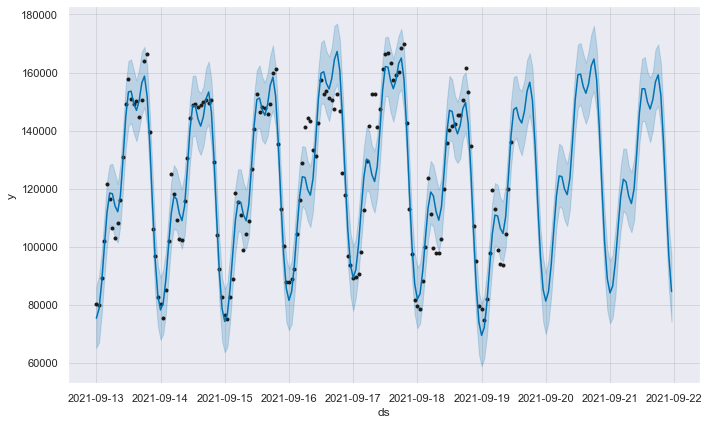

In [37]:
# pictures!
error = mean_absolute_percentage_error(df[-predictions:]['y'], forecast[-predictions:]['yhat'])
print("Mean absolute percentage error {0:.2f}%".format(error))
_ = model.plot(forecast)

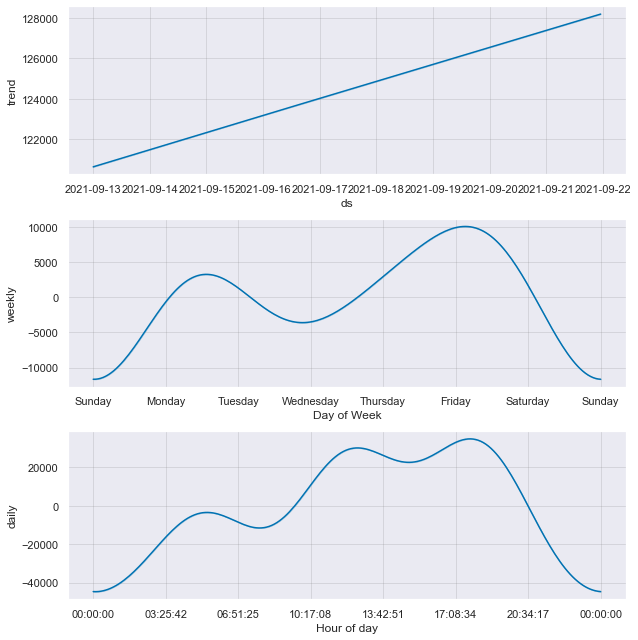

In [38]:
_ = model.plot_components(forecast)

### Возьмем попрактикуемся в использовании библиотеки Prophet. Попробуем сделать прогноз для датасета _National Oceanic and Atmospheric Administration_ (NOAA), который содержит в себе замеры выбросов в атмосферу парниковых газов, начиная с 1961 года:

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
from prophet import Prophet

В качестве входного датасета, Prophet требует, чтобы датафрейм всегда имел две колонки:
1. __ds__  - datestamp, колонка datestamp/timestamp, которая содержит дату измерения временного ряда
2. __y__   - непосредственно измерение на указанную дату

__FYA__: Да, колонки должны быть именно с такими названиями, поэтому с преобразованием датасета все равно надо немного повозиться.

In [41]:
# Изменим датасет как это требует документация библиотеки Prophet:
df = pd.read_csv('./../data/co2-ppm-daily_csv.csv')
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

In [43]:
df.head()

,ds,y
0,1958-03-30,316.16
1,1958-03-31,316.40
2,1958-04-02,317.67
3,1958-04-03,317.76
4,1958-04-04,317.09


При помощи комманды ```model.fit(df)``` класс модели проанализировал данные временного ряда и изолировал как сезонность так и тренд. Нам для этого не нужно было совершать никаких лишних телодвижений. Но пока мы не реализовали прогноз наших значений. Для того чтобы сделать прогноз, в первую очередь нам необходимо создать DataFrame наших будущих дат (дат прогноза) и применить на этот DataFrame метод ```predict()```

In [42]:
# Инициализируем модель и обучим ее
model = Prophet()
model.fit(df)

20:55:54 - cmdstanpy - INFO - Chain [1] start processing
20:56:13 - cmdstanpy - INFO - Chain [1] done processing


In [44]:
future = model.make_future_dataframe(periods=365 * 10)
forecast = model.predict(future)

In [45]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1958-03-30,314.881382,316.013681,317.632744,314.881382,314.881382,1.985651,1.985651,1.985651,0.003214,0.003214,0.003214,1.982437,1.982437,1.982437,0.0,0.0,0.0,316.867034
1,1958-03-31,314.883786,315.991460,317.734912,314.883786,314.883786,2.015767,2.015767,2.015767,-0.010712,-0.010712,-0.010712,2.026479,2.026479,2.026479,0.0,0.0,0.0,316.899552
2,1958-04-02,314.888592,316.106257,317.824880,314.888592,314.888592,2.118735,2.118735,2.118735,0.003358,0.003358,0.003358,2.115377,2.115377,2.115377,0.0,0.0,0.0,317.007327
3,1958-04-03,314.890995,316.236966,317.918988,314.890995,314.890995,2.160472,2.160472,2.160472,0.000555,0.000555,0.000555,2.159916,2.159916,2.159916,0.0,0.0,0.0,317.051467
4,1958-04-04,314.893398,316.254615,318.021805,314.893398,314.893398,2.208136,2.208136,2.208136,0.003850,0.003850,0.003850,2.204287,2.204287,2.204287,0.0,0.0,0.0,317.101534
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23032,2029-11-16,435.105705,422.572053,443.277946,424.653100,445.331149,-2.007830,-2.007830,-2.007830,0.003850,0.003850,0.003850,-2.011679,-2.011679,-2.011679,0.0,0.0,0.0,433.097875
23033,2029-11-17,435.112109,422.556672,443.257222,424.658272,445.341167,-1.969420,-1.969420,-1.969420,-0.004598,-0.004598,-0.004598,-1.964822,-1.964822,-1.964822,0.0,0.0,0.0,433.142689
23034,2029-11-18,435.118513,422.808675,443.557524,424.663444,445.351185,-1.915151,-1.915151,-1.915151,0.003214,0.003214,0.003214,-1.918365,-1.918365,-1.918365,0.0,0.0,0.0,433.203363
23035,2029-11-19,435.124918,422.576746,443.750581,424.668617,445.361203,-1.883110,-1.883110,-1.883110,-0.010712,-0.010712,-0.010712,-1.872398,-1.872398,-1.872398,0.0,0.0,0.0,433.241807


Таким образом теперь DataFrame forecast содержит прогноз по выбросам $CO_2$ на 10 лет вперед. Если взглянем на сам датафрейм то он содержит огромное количество статистик которые позволяют свести прогноз к аддитивной модели временного ряда:

* __ds__: Datestamp/timestamp
* __trend__: Значение тренда (компоненты временного ряда)
* __yhat_lower__: Нижняя граница доверительного интервала для прогноза
* __yhat_upper__: Верхняя граница доверительного интервала для прогноза
* __trend_lower__: Нижняя граница доверительного интервала для тренда
* __trend_upper__: Верхняя граница доверительного интервала для тренда
* __additive_terms__: Сложенные значения всех аддитивных сезонных компонент временного ряда
* __additive_terms_lower__: Нижняя граница доверительного интервала для аддитивных сезонных компонент временного ряда
* __additive_terms_upper__: Верхняя граница доверительного интервала для аддитивных сезонных компонент временного ряда
* __weekly__: Значение недельной сезонной компоненты
* __weekly_lower__: Нижняя граница доверительного интервала для недельных сезонных компонент временного ряда
* __weekly_upper__: Верхняя граница доверительного интервала для недельных сезонных компонент временного ряда
* __yearly__: Годовой сезонный компоненты
* __yearly_lower__: Нижняя граница доверительного интервала для годовых сезонных компонент временного ряда
* __yearly_upper__: Верхняя граница доверительного интервала для годовых сезонных компонент временного ряда
* __multiplicative_terms__: Комбинированные значения всех мультипликативных компонент сезонностей
* __multiplicative_terms_lower__: Нижняя граница для мультипликативных компонент
* __multiplicative_terms_upper__: Верхняя граница для мультипликативных компонент
* __yhat__: Прогноз значения временного ряда - комбинация тренда + мультипликативных компонент + аддитивных компонент

In [46]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1958-03-30,314.881382,316.013681,317.632744,314.881382,314.881382,1.985651,1.985651,1.985651,0.003214,0.003214,0.003214,1.982437,1.982437,1.982437,0.0,0.0,0.0,316.867034
1,1958-03-31,314.883786,315.991460,317.734912,314.883786,314.883786,2.015767,2.015767,2.015767,-0.010712,-0.010712,-0.010712,2.026479,2.026479,2.026479,0.0,0.0,0.0,316.899552
2,1958-04-02,314.888592,316.106257,317.824880,314.888592,314.888592,2.118735,2.118735,2.118735,0.003358,0.003358,0.003358,2.115377,2.115377,2.115377,0.0,0.0,0.0,317.007327
3,1958-04-03,314.890995,316.236966,317.918988,314.890995,314.890995,2.160472,2.160472,2.160472,0.000555,0.000555,0.000555,2.159916,2.159916,2.159916,0.0,0.0,0.0,317.051467
4,1958-04-04,314.893398,316.254615,318.021805,314.893398,314.893398,2.208136,2.208136,2.208136,0.003850,0.003850,0.003850,2.204287,2.204287,2.204287,0.0,0.0,0.0,317.101534


In [51]:
hvplot.plot(forecast[['ds', 'yhat']], kind='line', width=800, height=400, grid=True)

:Curve   [index]   (yhat)

Как визуализировать прогнозные значения временного ряда:

In [49]:
forecast[forecast['ds'] == '2022-10-17']

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
20445,2022-10-17,418.537917,413.733226,416.664458,417.208626,419.601168,-3.261083,-3.261083,-3.261083,-0.010712,-0.010712,-0.010712,-3.250371,-3.250371,-3.250371,0.0,0.0,0.0,415.276834


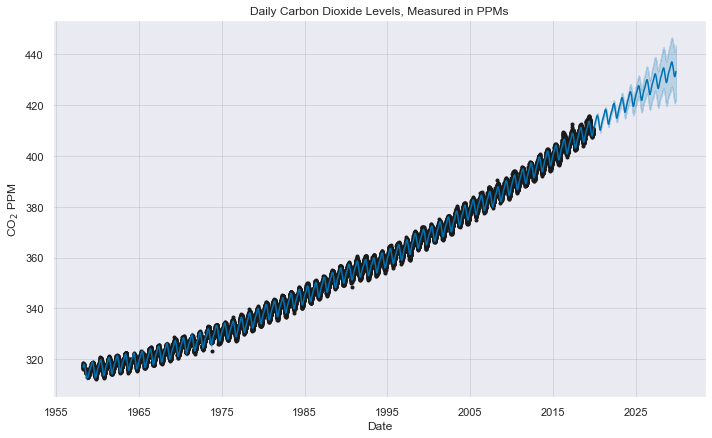

In [47]:
fig = model.plot(forecast, xlabel='Date',
                 ylabel=r'CO$_2$ PPM')
plt.title('Daily Carbon Dioxide Levels, Measured in PPMs')
plt.show()

Выведем компоненты текущего временного ряда:

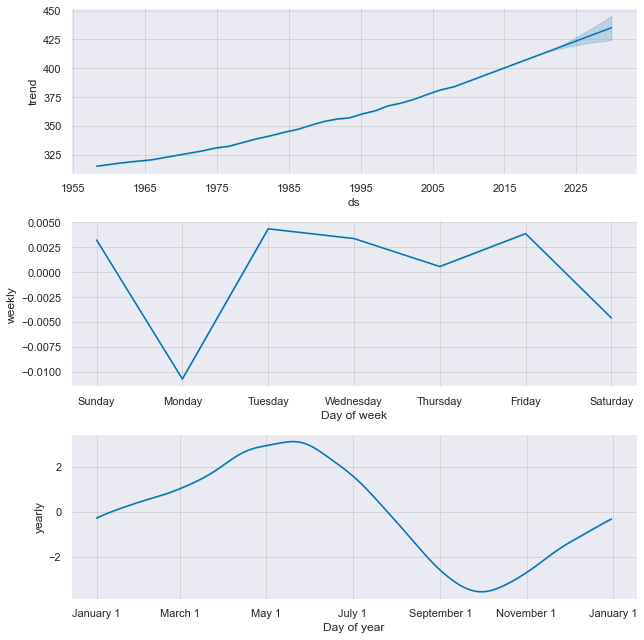

In [50]:
fig2 = model.plot_components(forecast)
plt.show()

### Библиотека Prophet и Non-Daily Данные

Изначально когда разрабатывалась библиотека Prophet, ее реализовали таким образом, чтобы была возможность использовать ее на дневных шкалах временного ряда (daily scale), то есть каждое наблюдение/измерение в данных временного ряда - записано на 1 день. Это делает ее неудобной для использования вне такой шкалы без знания определенных методов. Возьмем наш любимый датасет с авиа пассажиропотоком (Air Passengers), где наблюдения не распределены в дневной шкале и посмотрим как библиотека справится с таким типом датасета:

In [52]:
df = pd.read_csv('./../data/AirPassengers.csv')
df['Month'] = pd.to_datetime(df['Month'])
df.columns = ['ds', 'y']

In [53]:
df.head()

,ds,y
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121


Мы сделали прогноз с ежедневными данными за 5 лет, но предоставили Prophet ежемесячные данные. Prophet может правильно реализовать свои расчеты для сезонности только в первый день каждого месяца, когда у него есть хорошие обучающие данные. Однако в оставшиеся дни он не совсем понимает, что делать, и завышает свою кривую сезонности довольно непредсказуемым образом и соответственно расширяет доверительный интервал но невообразимых размеров:

21:11:10 - cmdstanpy - INFO - Chain [1] start processing
21:11:10 - cmdstanpy - INFO - Chain [1] done processing


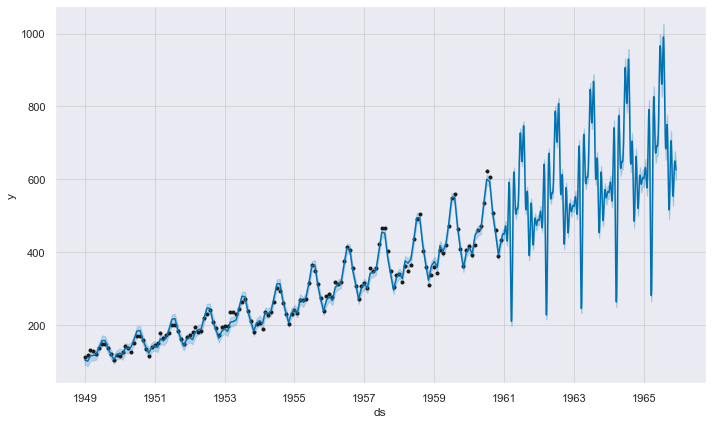

In [54]:
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=365 * 5)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

Это довольно легко исправить, если указать библиотеке период прогноза на ежемесячной основе (для тренировочной выборки). Для этого необходимо поменять либо доавить в метод ```make_future_dataframe()``` аргумент ```freq='MS'``` и соответственно обновить параметр ```periods```:

21:12:54 - cmdstanpy - INFO - Chain [1] start processing
21:12:54 - cmdstanpy - INFO - Chain [1] done processing


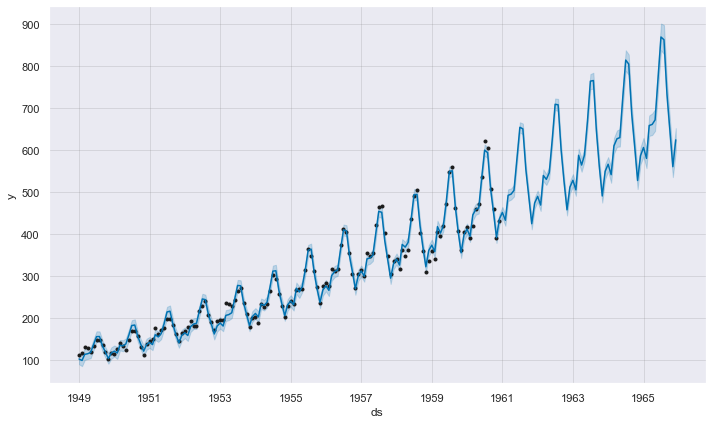

In [55]:
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=12 * 5,
                                     freq='MS')
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

### Библиотека Prophet и Sub-Daily данные для временного ряда:

Рассмотрим следующий пример на датасете __Divvy Bike share program__, который содержит данные по количеству аренды и поездок на велосипедах за кжадый час, начиная с 2014 по 2018 гг. График не совсем похож на стандартный график временного ряда с которым мы работали до этого, но нас это не должно пугать, так как данные внутридневные (__несколько наблюдений для одного дня__).  Нам необходимо правильно подобрать значение _freq_ и значение _periods_ Для того чтобы мы могли сделать более или менее качественный прогноз для такого временного ряда:

In [56]:
data = pd.read_csv('./../data/divvy_hourly.csv')
df = pd.DataFrame({'ds': pd.to_datetime(data['date']),
                   'y': data['rides']})

In [57]:
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=365 * 24, freq='h')

21:13:47 - cmdstanpy - INFO - Chain [1] start processing
21:14:14 - cmdstanpy - INFO - Chain [1] done processing


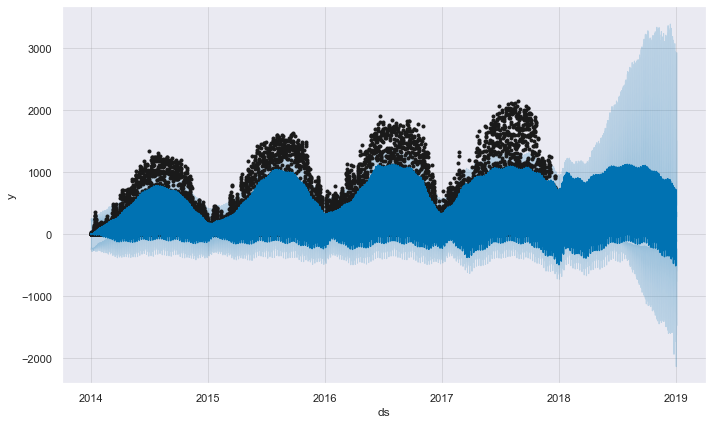

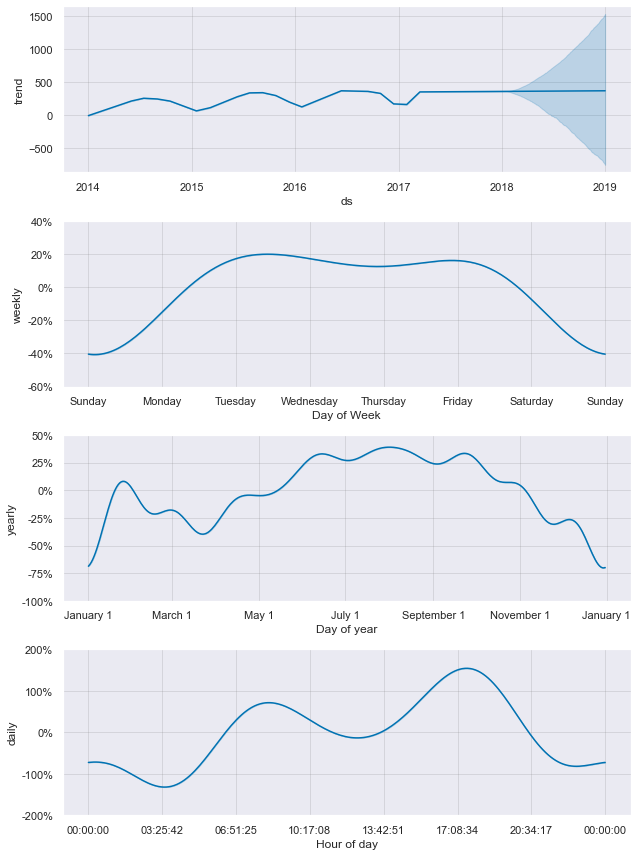

In [58]:
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()
fig2 = model.plot_components(forecast)
plt.show()

### Библиотека Prophet и Данные с пропущенными измерениями:

В вашей работе вы можете столкнуться с данными временного ряда в которых, на конкретный промежуток (дату) отсутствует наблюдение. Да мы можем сами экстраполировать такие данные, но Prophet имеет механизм работы с такими данными и показывает неплохое качество работы алгоритма. Рассмотрим пример:

In [59]:
df = df[(df['ds'].dt.hour >= 8) & (df['ds'].dt.hour < 18)]

In [60]:
hvplot.plot(df, kind='scatter', width=900, height=400, label='Bike Rides Chicago, hourly measures', grid=True)

:Scatter   [index]   (y)

21:20:15 - cmdstanpy - INFO - Chain [1] start processing
21:20:37 - cmdstanpy - INFO - Chain [1] done processing


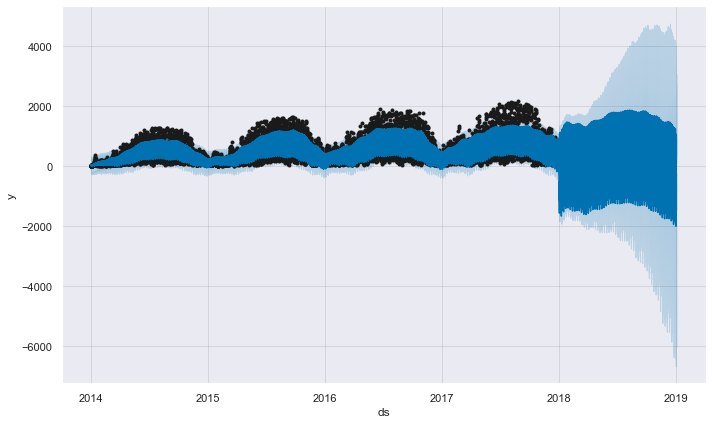

In [61]:
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)

future = model.make_future_dataframe(periods=365 * 24,
                                     freq='h')
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

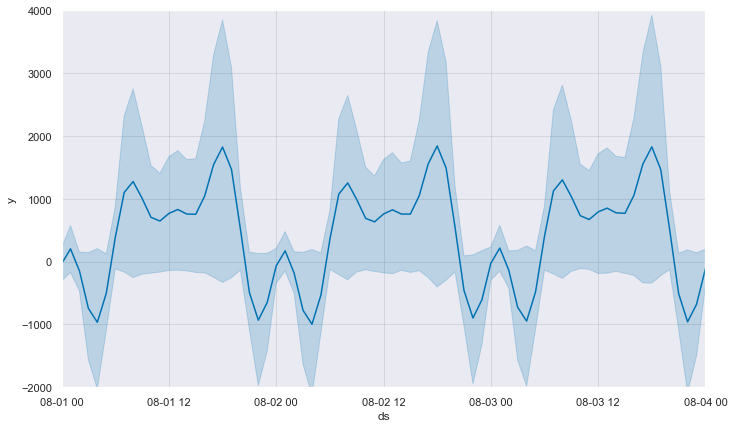

In [62]:
fig = model.plot(forecast)
plt.xlim(pd.to_datetime(['2018-08-01', '2018-08-04']))
plt.ylim(-2000, 4000)
plt.show()

### Библиотека Prophet и Сезонность:

In [63]:
df = pd.read_csv('./../data/AirPassengers.csv')
df ['Month'] = pd.to_datetime(df['Month'])
df.columns = ['ds', 'y']

Когда инициализируем объект модели Prophet мы явно можем задать аргумент, который отвечает за версию сезонности ```seasonality_mode = 'additive'/'multiplicative'```. По умолчанию библиотека использует аддитивную модель. Пока не обращайте внимания на аргумент ```yearly_seasonality```

21:22:35 - cmdstanpy - INFO - Chain [1] start processing
21:22:35 - cmdstanpy - INFO - Chain [1] done processing


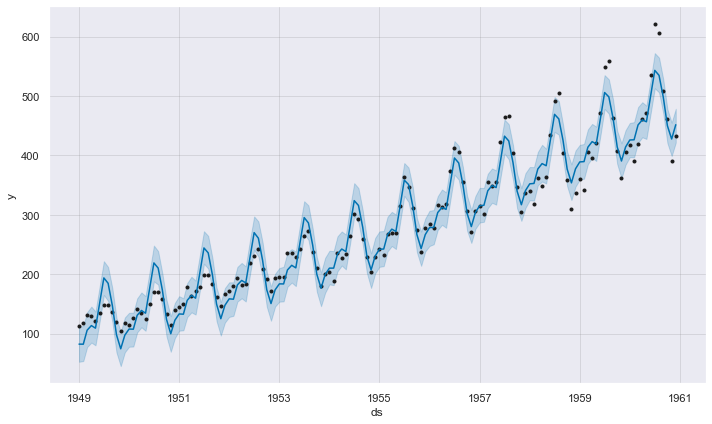

In [64]:
model_a = Prophet(seasonality_mode='additive', yearly_seasonality=4)
model_a.fit(df)
forecast_a = model_a.predict()
fig_a = model_a.plot(forecast_a)
plt.show()

В чем разница между 2-мя подходами:

21:22:58 - cmdstanpy - INFO - Chain [1] start processing
21:22:58 - cmdstanpy - INFO - Chain [1] done processing


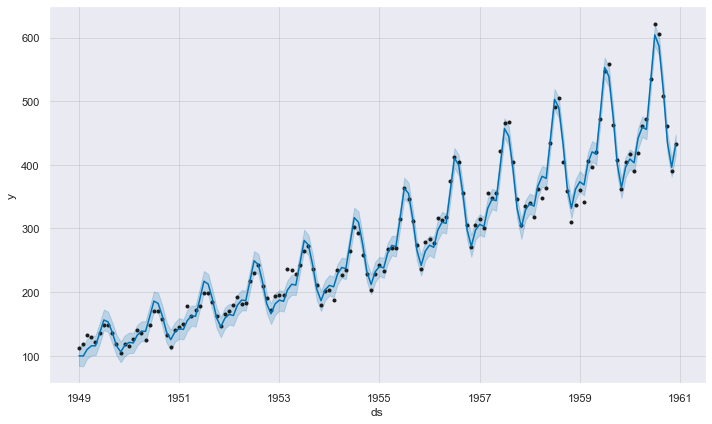

In [65]:
model_m = Prophet(seasonality_mode='multiplicative',
                  yearly_seasonality=4)
model_m.fit(df)
forecast_m = model_m.predict()
fig_m = model_m.plot(forecast_m)
plt.show()

Посмотрим на компоненты 2-х подходов


Кажется что они идентичны. Разница в оси-ординат, в случае с аддитивным подходом шкала оси - абсолютные значения, в случае с мультипликативным - проценты (изменения/отклонения от тренда).

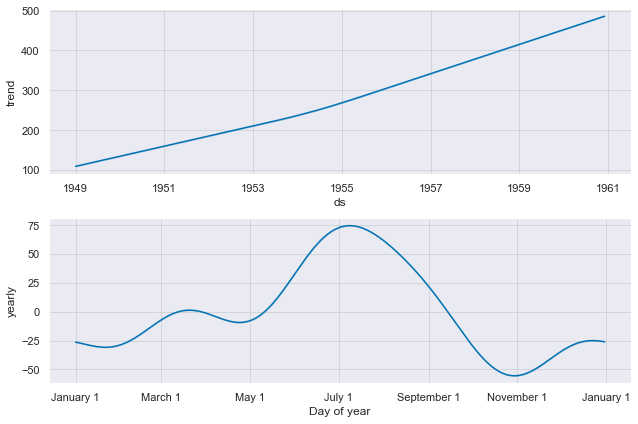

In [66]:
fig_a2 = model_a.plot_components(forecast_a)
plt.show()

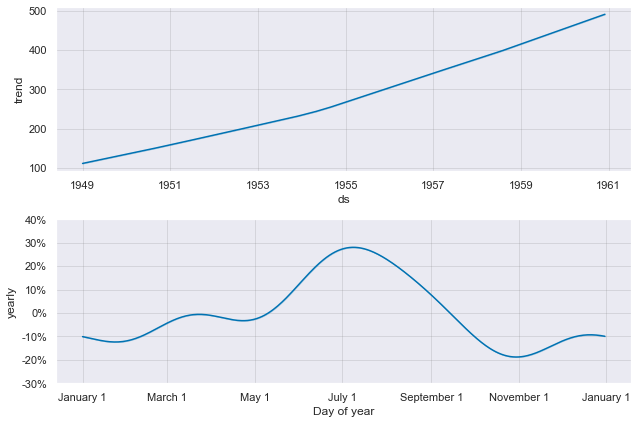

In [67]:
fig_m2 = model_m.plot_components(forecast_m)
plt.show()

Попробуем поиграться с сезонностью для датасета с арендой велосипедов, чтобы подогнать более качественный прогноз:

In [68]:
df = pd.read_csv('./../data/divvy_daily.csv')
df = df[['date', 'rides']]
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

21:24:17 - cmdstanpy - INFO - Chain [1] start processing
21:24:17 - cmdstanpy - INFO - Chain [1] done processing


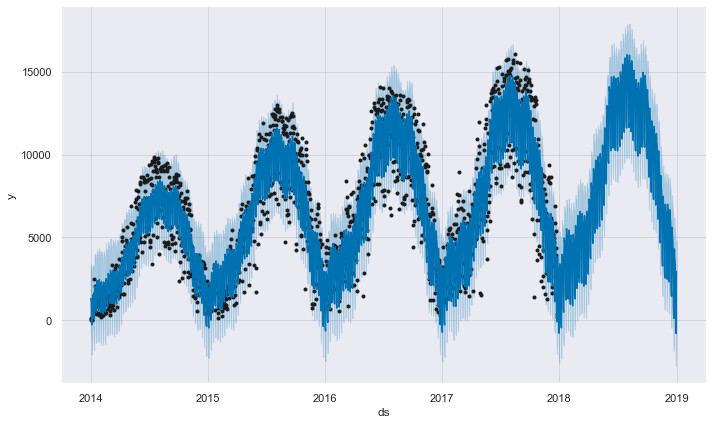

In [69]:
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

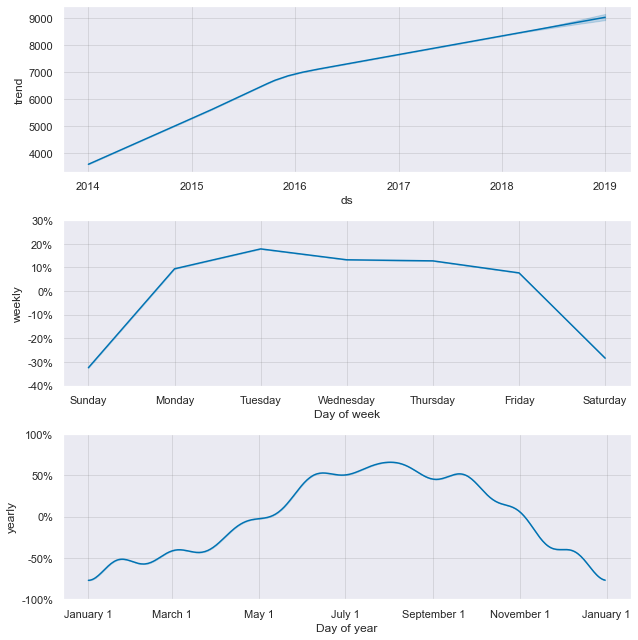

In [70]:
fig2 = model.plot_components(forecast)
plt.show()

Как мы могли бы заметить, что годовая кривая сезонности довольно "волнистая". Возможно,мы бы хотели иметь более плавную кривую чтобы легче предсказывать значения ряда, а не кривую с таким количеством точек перегиба. Так получается, потому что это результат того, что наша годовая сезонность слишком гибкая, имеет слишком много степеней свободы и слишком много математических параметров, управляющих кривой в модели данной библиотеки. В Prophet количество параметров, управляющих кривой сезонности называется порядком Фурье.

### Библиотека Prophet и оптимизация сезонной компоненты при помощи [преобразования Фурье](https://ru.wikipedia.org/wiki/%D0%9F%D1%80%D0%B5%D0%BE%D0%B1%D1%80%D0%B0%D0%B7%D0%BE%D0%B2%D0%B0%D0%BD%D0%B8%D0%B5_%D0%A4%D1%83%D1%80%D1%8C%D0%B5):


Манипуляции с компонентом сезонности - отличительная особенность библиотеки Prophet. Под капотом такая манипуляция реализована при помощи преобразования Фурье. Для того, чтобы понять что такое ряд фурье и как порядок ряда Фурье может относиться к времнному ряду, проведем аналогии с хорошо знакомой нам моделью линейной регрессии. Как мы уже значете порядок полинома в уравнении линейной регрессии всегда будет улучшать прогнозную силу линейной регрессии (особенно когда наши данные нелинейно зависимы). Ниже пример порядков для аппроксимации работы алгоритма линейной регрессии (несколько вариаций моделей пытаются хорошо задетектить случайые точки в пространстве):

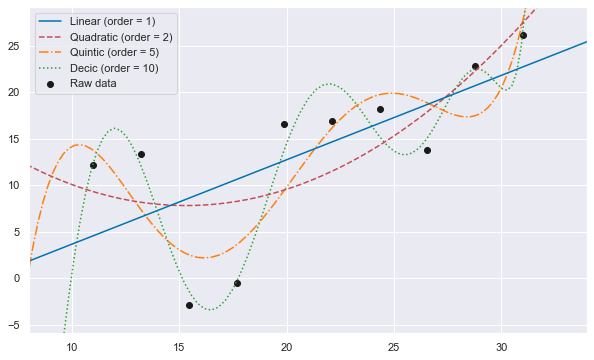

In [71]:
import statsmodels.formula.api as sm
import random
random.seed(2)

x = np.linspace(11, 31, 10)
y = np.array([.025 * val**2 + random.uniform(-10, 10) for val in x])
data = {"x": x, "y": y}
x2 = np.array([.025 * val**2 for val in np.linspace(1, 11, 80)] +
              [.025 * val**2 for val in np.linspace(11, 31, 80)] +
              [.025 * val**2 for val in np.linspace(31, 41, 80)])

model1 = sm.ols(formula = 'y ~ x', data = data).fit()
model2 = sm.ols(formula = 'y ~ np.power(x, 2) + x', data = data).fit()
model5 = sm.ols(formula = 'y ~ x + np.power(x, 2) + np.power(x, 3) + np.power(x, 4) + np.power(x, 5) + x', data = data).fit()
model10 = sm.ols(formula = 'y ~ x + np.power(x, 2) + \
                                     np.power(x, 3) + \
                                     np.power(x, 4) + \
                                     np.power(x, 5) + \
                                     np.power(x, 6) + \
                                     np.power(x, 7) + \
                                     np.power(x, 8) + \
                                     np.power(x, 9) + \
                                     np.power(x, 10)', data = data).fit()

plt.figure(figsize=(10, 6))
plt.scatter(x, y, label='Raw data', c='k')

plt.plot(x2, model10.params[0] +
             model10.params[1] * x2 +
             model10.params[2] * x2**2 +
             model10.params[3] * x2**3 +
             model10.params[4] * x2**4 +
             model10.params[5] * x2**5 +
             model10.params[6] * x2**6 +
             model10.params[7] * x2**7 +
             model10.params[8] * x2**8 +
             model10.params[9] * x2**9 +
             model10.params[10] * x2**10,
         label='Decic (order = 10)', c='tab:green', ls=':')

plt.plot(x2, model5.params[0] +
             model5.params[1] * x2 +
             model5.params[2] * x2**2 +
             model5.params[3] * x2**3 +
             model5.params[4] * x2**4 +
             model5.params[5] * x2**5,
         label='Quintic (order = 5)', c='tab:orange', ls='-.')

plt.plot(x2, model2.params[0] +
             model2.params[1] * x2**2 +
             model2.params[2] * x2,
         label='Quadratic (order = 2)', c='r', ls='--')

plt.plot(x2, model1.params[0] +
             model1.params[1] * x2,
         label='Linear (order = 1)', c='#0072B2', ls='-')

plt.ylim(-5, 35)
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(reversed(handles), reversed(labels))
plt.xlim(x.min() - 3, x.max() + 3)
plt.ylim(y.min() - 3, y.max() + 3)
plt.show()

Окей, линейная регрессия с порядком равной 1, хорошо схватывает восходящий тренд, но упускает существенные детали распределения данных. Квадратичное параметрическое уравнение хорошо "прилегает" к данным. Но порядок 5 и 10 уже полностью "переобучаются" на данных и захватывают условный случайный шум данных. Если мы добавим еще данных из нашего распределения, то скорее всего линии с порядком 5 и 10 изменят свое поведение (но не факт), а квадратичная и линейные формы остануться постоянными либо изменяться не так сильно. Таким образом, мы можем сделать гипотетический вывод (не эмпирический), что: __Порядок полинома пропорционален количеству "изгибов", которые может сделать кривая в пространстве, чтобы лучше описать распределение данных.__ [Доказательство](https://arxiv.org/ftp/arxiv/papers/1912/1912.00414.pdf)


__Последовательность Фурье - это просто сумма синусоид, которые пытаются как можно корректно отобразить истинное распределение.__ При помощи изменения размерностей отдельно взятых синусоид - _амплитуды, высота ряда, период, дистанция от одного пика к другому, фазы, фазовые сдвиги, длина ряда, цикл и т.д._ мы можем воссоздать новую более сложную форму ряда или приблизить наш ряд к нашему распределению генеральной совокупности.


В линейной подходе мы изменяли порядок многочлена (полинома) чтобы хоть как-то контроллировать степень изогнутости кривой ряда, для этого пользовались неким коэффициентом $\beta$ чтобы задавать и описывать форму кривой (вспоминаем коэффициенты линейной регрессии). Точно также в последовательностях мы можем изменять количество синусоид в ряду Фурье (называемый порядком Фурье) для того, чтобы контроллировать гибкость конечной кривой (также делает и Prophet подгоняя ряд при помощи ряда Фурье) - меняя амплитуду, период, фазу волн.

Пример для визуализации работы. Основная линия - это сумма каждой компоненты синусоиды. Увеличивая/Уменьшая порядок Фурье в нашей модели мы всегда можем добиваться лучшего схождения нашей прямой к нашему распределению для любого набора данных, но это также может привести к переобучению/недообучению, поэтому используется оптимизация для нахождения лучшего порядка ряда.

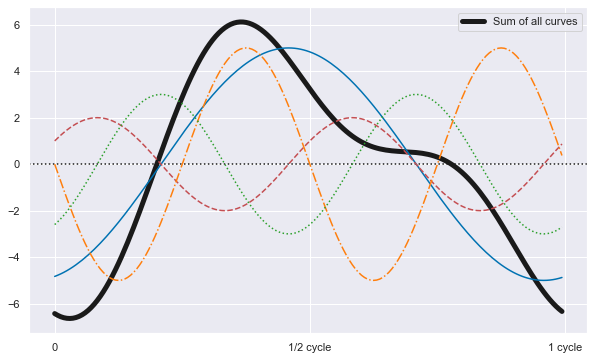

In [72]:
x = pd.date_range('2022-01-01', '2022-01-01', freq='H')
x = range(24 * 7)
y0 = [(-5 * np.sin(((idx / 7) - 17) * (360 / 24) * (np.pi / 180))) for idx in range(len(x))]
y1 = [(-2 * np.sin(((idx / 7) - 5) * (360 / 12) * (np.pi / 180))) for idx in range(len(x))]
y2 = [(-5 * np.sin(((idx / 7) - 12) * (360 / 12) * (np.pi / 180))) for idx in range(len(x))]
y3 = [(-3 * np.sin(((idx / 7) - 20) * (360 / 12) * (np.pi / 180))) for idx in range(len(x))]
y = [y0[idx] + y1[idx] + y2[idx] + y3[idx] for idx in range(len(x))]

plt.figure(figsize=(10, 6))
plt.axhline(0, ls=':', c='k')
plt.plot(y, lw=5, c='k', label='Sum of all curves')
plt.plot(y0, c='#0072B2', ls='-')
plt.plot(y1, c='r', ls='--')
plt.plot(y2, c='tab:orange', ls='-.')
plt.plot(y3, c='tab:green', ls=':')
plt.legend()
plt.xticks(ticks=[0, 84, 168], labels=[0, '1/2 cycle', '1 cycle'])
plt.show()

Где указывается порядок ряда в бибилиотеке Prophet. Он зашит в аргумент ```yearly_seasonality```:

In [73]:
from prophet.plot import plot_yearly
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4)
model.fit(df)

21:37:51 - cmdstanpy - INFO - Chain [1] start processing
21:37:51 - cmdstanpy - INFO - Chain [1] done processing


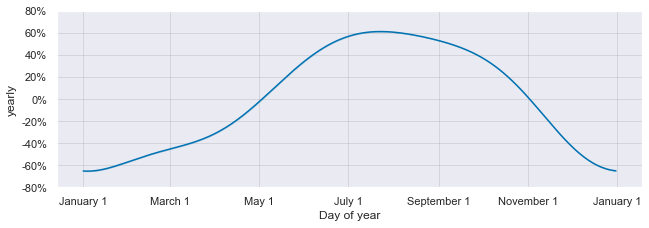

In [74]:
fig3 = plot_yearly(model, figsize=(10.5, 3.25))
plt.show()

Добавление кастомных параметров для сезонной компоненты. До этого были примеры с дефолтными параметрами компоненты сезонности: годовая, недельная, дневная. А что если мы хотим добавить свою сезонность, если мы заранее уверены в этом или эмпирическим путем проверили и доказали это?

Возьмем датасет наблюдений за солнечными пятнами, в нем 11-летний цикл. Как можно указывать кастомный сезонный компонент временного ряда для модели:

In [75]:
df = pd.read_csv('./../data/sunspots.csv',usecols=['Date', 'Monthly Mean Total Sunspot Number'])
df['Date'] = pd.to_datetime(df['Date'])
df.columns = ['ds', 'y']

In [76]:
hvplot.plot(df, kind='scatter', width=900, height=400, grid=True)

:Scatter   [index]   (y)

In [77]:
# На моменте инициализации модели не указываем порядок:
model = Prophet(seasonality_mode='multiplicative', yearly_seasonality=False)
# Добавляем его после инициализации
model.add_seasonality(name='11-year cycle',
                      period=11 * 365.25,
                      fourier_order=5)

21:40:34 - cmdstanpy - INFO - Chain [1] start processing
21:40:35 - cmdstanpy - INFO - Chain [1] done processing


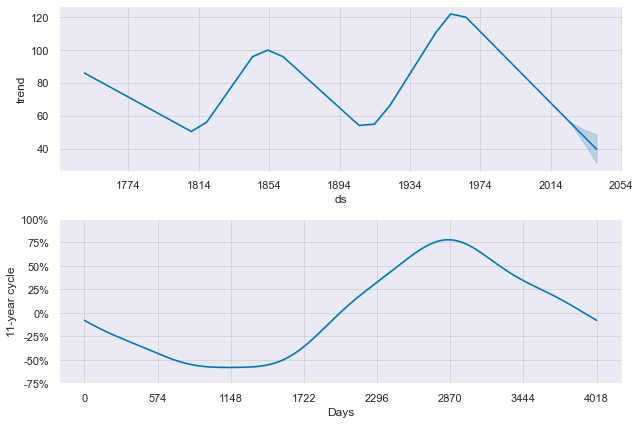

In [78]:
model.fit(df)
future = model.make_future_dataframe(periods=240, freq='M')
forecast = model.predict(future)
fig2 = model.plot_components(forecast)
plt.show()

In [79]:
model.seasonalities

OrderedDict([('11-year cycle',
              {'period': 4017.75,
               'fourier_order': 5,
               'prior_scale': 10.0,
               'mode': 'multiplicative',
               'condition_name': None})])

__FYA__: Когда вы указываете период вашей сезонности, он всегда должен быть выражен в днях, так как по другому Prophet не понимает и вы можете совершить грубые ошибки. Например 10-летняя сезонность = 10 * 365.25 = 3652.5 дня. Часовая сезонность 1 (день) / 24 (часов в дне) = 0.04167 дней.
Так же не перепутайте аргументы для сезонности, которые используются в методе ```make_future_dataframe()``` (я так к сожалению делал первое время), там используется аргумент ```freq```.
И Добавляем параметры сезонности ДО ОБУЧЕНИЯ МОДЕЛИ иначе выдаст ошибку:

In [80]:
model.add_seasonality(name='hourly',
                      # an hour is 0.04167 days
                      period=1 / 24,
                      # experiment with this value
                      fourier_order=5)

Exception: Seasonality must be added prior to model fitting.

In [82]:
model.add_seasonality(name='quarterly',
                      # a quarter is 91.3125 days
                      period=365.25 / 4,
                      # experiment with this value
                      fourier_order=5)

Exception: Seasonality must be added prior to model fitting.

### Библиотека Prophet и условные компоненты сезонности:

Предположим, вы работаете с задачей для энергетической компании. Перед вами стоит задача спрогнозировать потребление электроэнергии на следующий год. Потребление электроэнергии в какой-то степени будет зависеть от населения города, уровня дохода населения, температуры на улице и т.д. Как настроить Prophet для обработки этого сценария. Возьмем датасет аренды велосипедов, там также присутствует такой вариант сезонности:

In [83]:
df = pd.read_csv('./../data/divvy_hourly.csv')
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

In [84]:
def is_weekend(ds):
    date = pd.to_datetime(ds)
    return (date.dayofweek == 5 or date.dayofweek == 6)

df['weekend'] = df['ds'].apply(is_weekend)
df['weekday'] = ~df['ds'].apply(is_weekend)
df.head()

,ds,y,weekend,weekday
0,2014-01-01 01:00:00,1,False,True
1,2014-01-01 02:00:00,9,False,True
2,2014-01-01 03:00:00,4,False,True
3,2014-01-01 04:00:00,1,False,True
4,2014-01-01 07:00:00,2,False,True


In [85]:
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=6,
                weekly_seasonality=6,
                daily_seasonality=False)

In [86]:
model.add_seasonality(name='daily_weekend',
                      period=1,
                      fourier_order=3,
                      condition_name='weekend')

model.add_seasonality(name='daily_weekday',
                      period=1,
                      fourier_order=3,
                      condition_name='weekday')

In [87]:
model.fit(df)
future = model.make_future_dataframe(periods=365 * 24,
                                     freq='h')
future['weekend'] = future['ds'].apply(is_weekend)
future['weekday'] = ~future['ds'].apply(is_weekend)
forecast = model.predict(future)

21:47:19 - cmdstanpy - INFO - Chain [1] start processing
21:47:51 - cmdstanpy - INFO - Chain [1] done processing


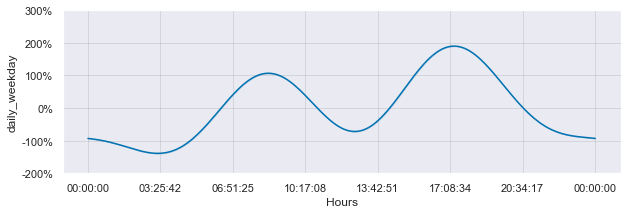

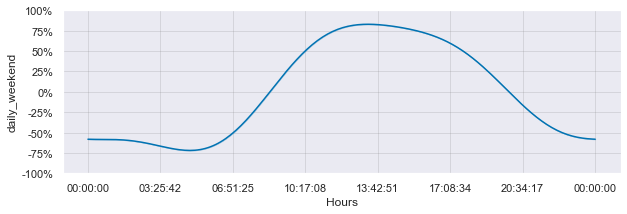

In [88]:
from prophet.plot import plot_seasonality
fig3 = plot_seasonality(model, 'daily_weekday',
                        figsize=(10, 3))
plt.show()
fig4 = plot_seasonality(model, 'daily_weekend',
                        figsize=(10, 3))
plt.show()

### Библиотека Prophet и Регуляризация сезонной компоненты:

Часто вам в любой задаче вам придется столкнуться с переобучением или недообучением. Временные ряды не исключение. Для того чтобы побороть эту проблему, как вы уже знаете нам помогает регуляризация.

Вариант Global Seasonality Regularization aka GSR:

Суть заключается в применении регуляризации ко всем данным временного ряда (отсюда и название - глобальный). Уменьшая количество ```seasonality_prior_scale``` мы таким образом применяем регуляризацию в модели Prophet.

In [89]:
df = pd.read_csv('./../data/divvy_daily.csv')
df = df[['date', 'rides']]
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

In [90]:
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                seasonality_prior_scale=.01)

21:51:17 - cmdstanpy - INFO - Chain [1] start processing
21:51:17 - cmdstanpy - INFO - Chain [1] done processing


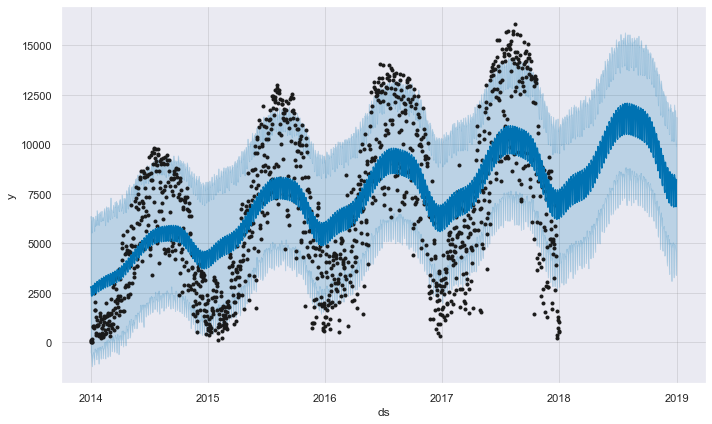

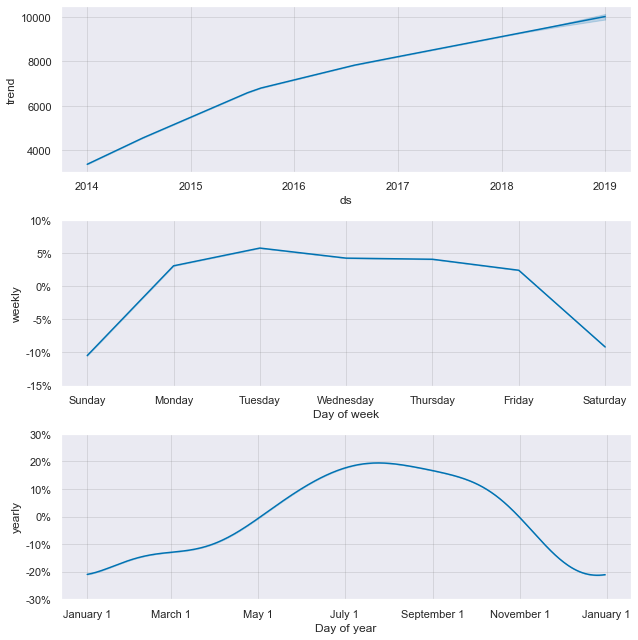

In [91]:
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()
fig2 = model.plot_components(forecast)
plt.show()

Небольшие украшения с production варианта, можете пользоваться при регуляризации:

In [92]:
from prophet.plot import seasonality_plot_df, set_y_as_percent
from matplotlib.dates import (
    MonthLocator,
    num2date,
    AutoDateLocator,
    AutoDateFormatter,
)
from matplotlib.ticker import FuncFormatter

def plot_seasonality2(m, name, ax=None, uncertainty=True, figsize=(10, 6), ls='-', c='#0072B2', label=''):
    """Plot a custom seasonal component.
    Parameters
    ----------
    m: Prophet model.
    name: Seasonality name, like 'daily', 'weekly'.
    ax: Optional matplotlib Axes to plot on. One will be created if
        this is not provided.
    uncertainty: Optional boolean to plot uncertainty intervals, which will
        only be done if m.uncertainty_samples > 0.
    figsize: Optional tuple width, height in inches.
    Returns
    -------
    a list of matplotlib artists
    """
    artists = []
    if not ax:
        fig = plt.figure(facecolor='w', figsize=figsize)
        ax = fig.add_subplot(111)
    # Compute seasonality from Jan 1 through a single period.
    start = pd.to_datetime('2017-01-01 0000')
    period = m.seasonalities[name]['period']
    end = start + pd.Timedelta(days=period)
    plot_points = 200
    days = pd.to_datetime(np.linspace(start.value, end.value, plot_points))
    df_y = seasonality_plot_df(m, days)
    seas = m.predict_seasonal_components(df_y)
    artists += ax.plot(df_y['ds'].dt.to_pydatetime(), seas[name], ls=ls,
                        c=c, label=label)
    if uncertainty and m.uncertainty_samples:
        artists += [ax.fill_between(
            df_y['ds'].dt.to_pydatetime(), seas[name + '_lower'],
            seas[name + '_upper'], color='#0072B2', alpha=0.2)]
    ax.grid(True, which='major', c='gray', ls='-', lw=1, alpha=0.2)
    n_ticks = 8
    xticks = pd.to_datetime(np.linspace(start.value, end.value, n_ticks)
        ).to_pydatetime()
    ax.set_xticks(xticks)
    if period <= 2:
        fmt_str = '{dt:%T}'
    elif name == 'weekly':
        fmt_str = '{dt:%A}'
    elif period < 14:
        fmt_str = '{dt:%m}/{dt:%d} {dt:%R}'
    else:
        fmt_str = '{dt:%m}/{dt:%d}'
    ax.xaxis.set_major_formatter(FuncFormatter(
        lambda x, pos=None: fmt_str.format(dt=num2date(x))))
    ax.set_xlabel('ds')
    ax.set_ylabel(name)
    if m.seasonalities[name]['mode'] == 'multiplicative':
        ax = set_y_as_percent(ax)
    return artists

def compare_seasonality(seasonality,
                        model_list,
                        figsize=(10, 3),
                        ls=['-', '--', '-.', ':'],
                        c=['#0072B2', 'r', 'tab:orange', 'tab:green']):
    fig = plt.figure(facecolor='w', figsize=figsize)
    ax = fig.add_subplot(111)
    for model in range(len(model_list)):
        plot_seasonality2(model_list[model],
                          seasonality,
                          ax=ax,
                          ls=ls[model],
                          c=c[model],
                          label='Seasonality prior scale: {}'.format(model_list[model].seasonality_prior_scale))
    plt.legend()
    plt.show()

In [93]:
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                seasonality_prior_scale=10)
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)

21:52:18 - cmdstanpy - INFO - Chain [1] start processing
21:52:18 - cmdstanpy - INFO - Chain [1] done processing


In [94]:
model3 = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                seasonality_prior_scale=.01)
model3.fit(df)
future3 = model3.make_future_dataframe(periods=365)
forecast3 = model3.predict(future3)

21:52:26 - cmdstanpy - INFO - Chain [1] start processing
21:52:26 - cmdstanpy - INFO - Chain [1] done processing


In [95]:
model4 = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                seasonality_prior_scale=.005)
model4.fit(df)
future4 = model4.make_future_dataframe(periods=365)
forecast4 = model4.predict(future4)

21:52:32 - cmdstanpy - INFO - Chain [1] start processing
21:52:33 - cmdstanpy - INFO - Chain [1] done processing


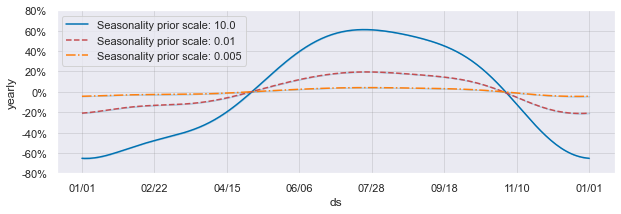

In [96]:
compare_seasonality('yearly', [model, model3, model4])

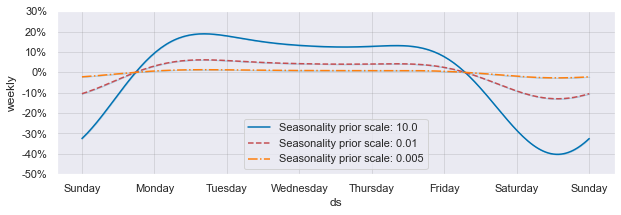

In [97]:
compare_seasonality('weekly', [model, model3, model4])

Вариант локальной регуляризации, где построив несколько моделей выше, выбрали лучшую:

21:54:38 - cmdstanpy - INFO - Chain [1] start processing
21:54:38 - cmdstanpy - INFO - Chain [1] done processing


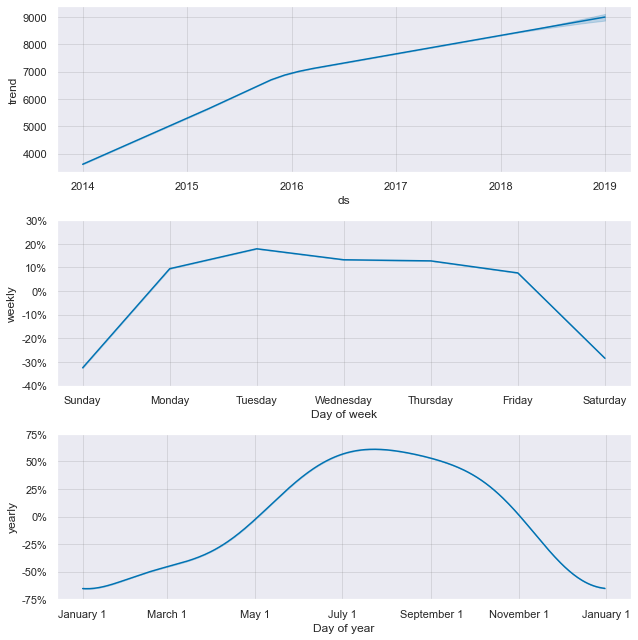

In [98]:
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                weekly_seasonality=False)

model.add_seasonality(name='weekly',
                      period=7,
                      fourier_order=4,
                      prior_scale=10)


model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig2 = model.plot_components(forecast)
plt.show()

### Библиотека Prophet и работа с календарными ивентами (праздники, выходные, специальные дни):

Так как библиотека разрабатывалась для того, чтобы решать бизнес задачи, важно учитывать такие факторы как праздники, выходные и прочие дни, которые могут повлиять на наше распределение и статистики временного ряда. В библиотеке встроены методы работы с такими ситуациями, а также мы можем добавлять свои праздники если таковые не обнаружены в дефолтной организации модуля.

[https://github.com/dr-prodigy/python-holidays#available-countries](https://github.com/dr-prodigy/python-holidays#available-countries)

Добавление дефолтных праздничных дней:

In [99]:
import pandas as pd
import matplotlib.pyplot as plt
from prophet import Prophet

df = pd.read_csv('./../data/divvy_daily.csv')
df = df[['date', 'rides']]
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4)

In [100]:
model.add_country_holidays(country_name='US')

21:56:45 - cmdstanpy - INFO - Chain [1] start processing
21:56:45 - cmdstanpy - INFO - Chain [1] done processing


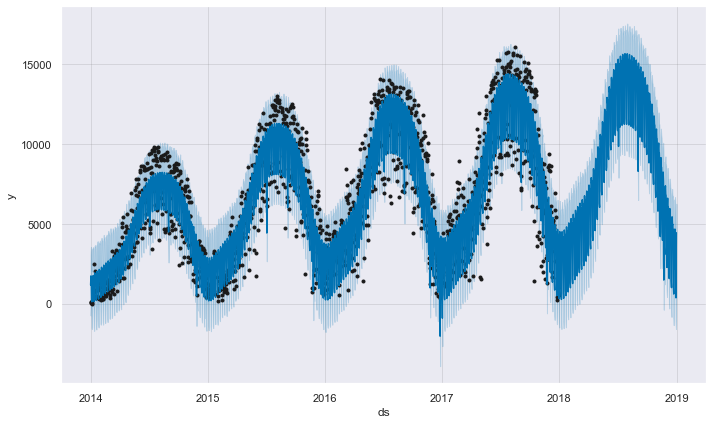

In [101]:
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

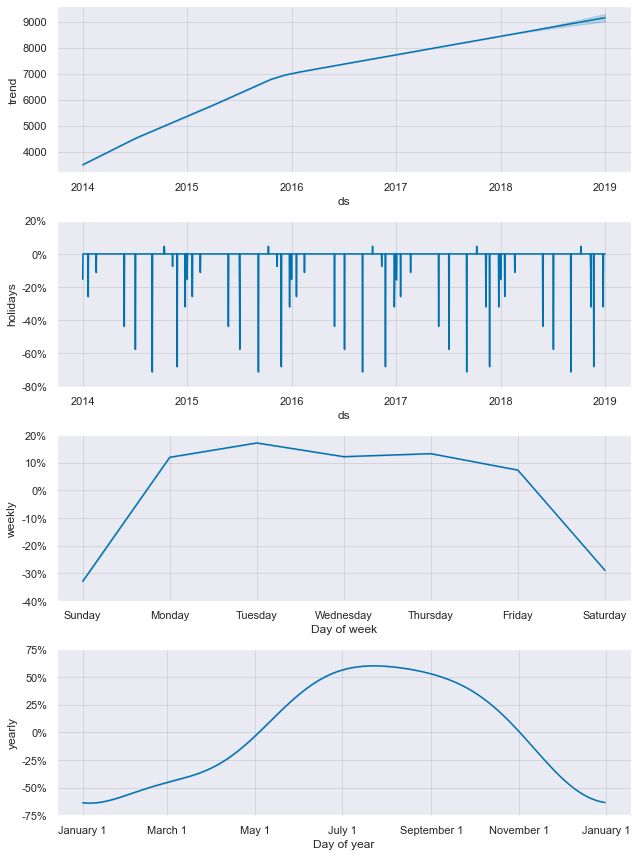

In [102]:
fig2 = model.plot_components(forecast)
plt.show()

In [103]:
model.train_holiday_names

0                  New Year's Day
1      Martin Luther King Jr. Day
2           Washington's Birthday
3                    Memorial Day
4                Independence Day
5                       Labor Day
6                    Columbus Day
7                    Veterans Day
8                    Thanksgiving
9                   Christmas Day
10       Christmas Day (Observed)
11      New Year's Day (Observed)
12        Veterans Day (Observed)
13    Independence Day (Observed)
dtype: object

Добавление дефолтных местных ивентов:

In [104]:
from prophet.make_holidays import make_holidays_df

year_list = df['ds'].dt.year.unique().tolist()
# Identify the final year, as an integer, and increase it by 1
year_list.append(year_list[-1] + 1)
holidays = make_holidays_df(year_list=year_list,
                            country='US',
                            state='IL')

In [105]:
holidays.head()

,ds,holiday
0,2016-01-01,New Year's Day
1,2016-01-18,Martin Luther King Jr. Day
2,2016-02-12,Lincoln's Birthday
3,2016-02-15,Washington's Birthday
4,2016-03-07,Casimir Pulaski Day


In [106]:
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                holidays=holidays)
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)

21:58:36 - cmdstanpy - INFO - Chain [1] start processing
21:58:37 - cmdstanpy - INFO - Chain [1] done processing


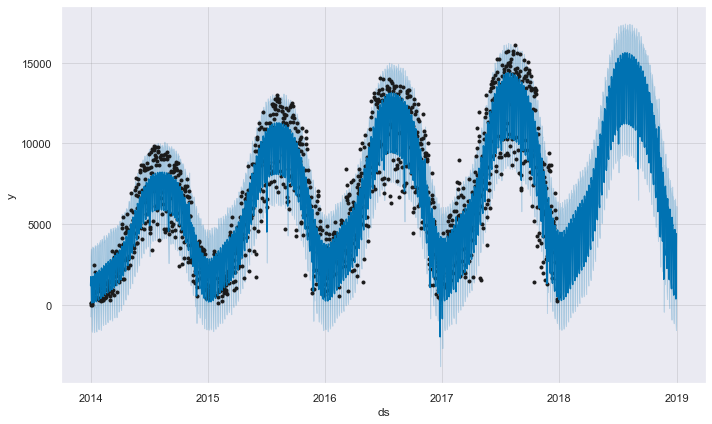

In [107]:
fig = model.plot(forecast)
plt.show()

Создание кастомного списка ивентов:

In [108]:
holidays = make_holidays_df(year_list=year_list,
                            country='US')

In [110]:
black_friday = pd.DataFrame({'holiday': 'Black Friday',
                             'ds': pd.to_datetime(
                                 ['2014-11-28',
                                  '2015-11-27',
                                  '2016-11-25',
                                  '2017-11-24',
                                  '2018-11-23'])})

christmas_eve = pd.DataFrame({'holiday': 'Christmas Eve',
                              'ds': pd.to_datetime(
                                  ['2014-12-24',
                                   '2015-12-24',
                                   '2016-12-24',
                                   '2017-12-24',
                                   '2018-12-24'])})

In [111]:
holidays = pd.concat([holidays, black_friday,
                      christmas_eve]).sort_values('ds')\
                      .reset_index(drop=True)

21:59:55 - cmdstanpy - INFO - Chain [1] start processing
21:59:55 - cmdstanpy - INFO - Chain [1] done processing


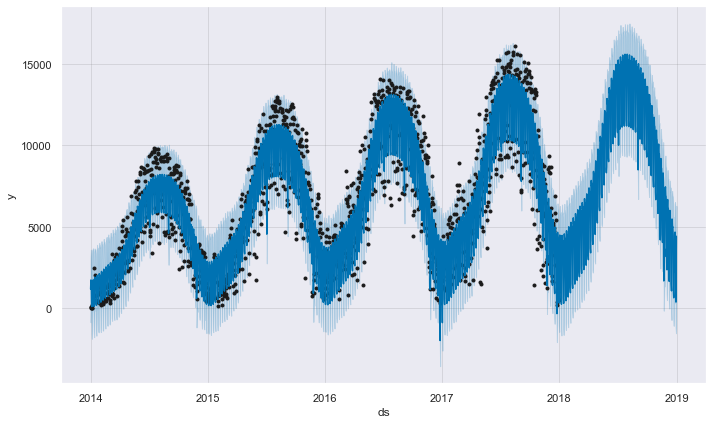

In [112]:
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                holidays=holidays)
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

Добавили, но что делаеть если вы измерили метрику и модель переобучилась на таких созданных признаках. Регуляризация!

22:00:04 - cmdstanpy - INFO - Chain [1] start processing
22:00:04 - cmdstanpy - INFO - Chain [1] done processing


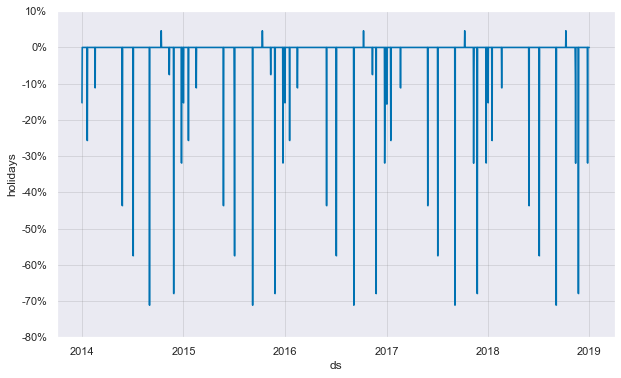

In [113]:
from prophet.plot import plot_forecast_component
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                holidays_prior_scale=10)
model.add_country_holidays(country_name='US')
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = plot_forecast_component(model, forecast, 'holidays')
plt.show()

22:00:12 - cmdstanpy - INFO - Chain [1] start processing
22:00:12 - cmdstanpy - INFO - Chain [1] done processing


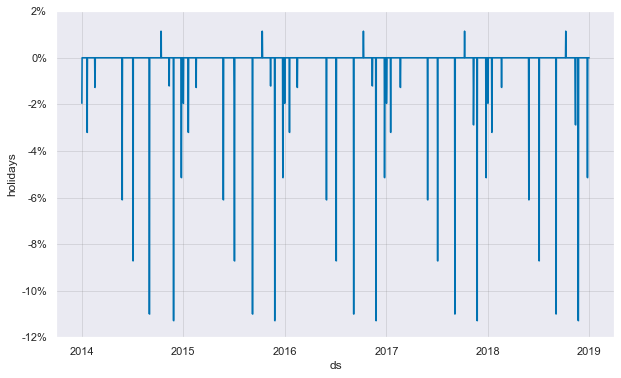

In [114]:
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                holidays_prior_scale=0.05)
model.add_country_holidays(country_name='US')
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = plot_forecast_component(model, forecast, 'holidays')
plt.show()

# Дополнительная информация, что есть еще:
----

# Amazon GluonTS - new big player on the market

https://github.com/awslabs/gluon-ts

В июне 2019 года компания Amazon выложила в открытый доступ замечательный инструмент - [GluonTS](https://github.com/awslabs/gluon-ts), позволяющий максимально быстро и эффективно строить, оценивать и использовать модели временных рядов, основанные на глубоком обучении и вероятностном подходе. 

## Что внутри GluonTS?

Amazon пошёл дальше и использовал рекуррентные нейронные сети (в частности, LSTM), а также свертки и механизмы внимания, обернув всё это в крайне удобную верхнеуровневую библиотеку. В частности, GluonTS содержит:
- Инструменты, необходимые для построения и обучения наиболее распространённых архитектур нейронных сетей, а также компоненты для моделирования и трансформации вероятностых распределений
- Механизмы для загрузки и предварительной обработки данных, в том числе автоматической генерации признаков из временных рядов
- Несколько готовых к использованию state-of-the-art прогнозных моделей
- Инструменты для оценки и сравнения различных моделей

Если не вдаваться в подробности, GluonTS позволяет быстро и практически из коробки получить качественную модель временного ряда, на выходе из которой вместо точечной оценки прогнозных значений мы получаем целое смоделированное вероятностное распределение. Таким образом, мы можем с лёгкостью оперировать доверительными интервалами прогноза и с любой удобной нам вероятностью получать диапазон наиболее вероятных будущих значений ряда. 


В [оригинальной статье](https://aws.amazon.com/ru/blogs/machine-learning/creating-neural-time-series-models-with-gluon-time-series/) авторы использовали временной ряд с ценами акций компании Amazon. Ярко выраженных паттернов, за исключением восходящих/нисходящих трендов, в финансовых временных рядах обычно не бывает, поэтому прогнозы в статье выглядят больше как некоторый шум, колеблющийся вокруг спрогнозированной линии тренда.

Так что посмотрим, чего можно добиться на наших собственных данных

In [49]:
df = pd.read_csv('./../data/currency.csv', index_col=0)
df.index = pd.to_datetime(df.index)

### Готовим данные

Попробуем построить модель. GluonTS предоставляет верхнеуровневую абстрацию `Dataset`, которая переводит разнородные форматы данных в один, удобный для последующей работы моделей. В частности, `ListDataset` переводит данные в список словарей, где отдельно записаны значения ряда и таймстэмпы. Для создания такого датасета мы передаём наш исходный временной ряд, указываем его частоту (в данном случае у нас дневные данные, поэтому частота ``"D"``), а также точку, до которой наш ряд будет отнесён к тренировочной выборке:

In [53]:
from gluonts.dataset.common import ListDataset
training_data = ListDataset(
    [{"start": df.index[0], "target": df.GEMS_GEMS_SPENT[:"2018-08-01"]}],
    freq = "D"
)

Посмотрим, в какой формат преобразовались данные:

In [54]:
training_data

[{'start': Period('2018-05-01', 'D'),
  'target': array([1199436., 1045515.,  586111.,  856601.,  793775.,  606535.,
         1112763., 1121218.,  813844.,  903343.,  863465.,  639224.,
         1030389., 1132645., 1018672., 1726870., 1378430.,  532950.,
          828238.,  823948.,  592549.,  939337.,  862611.,  551557.,
          878375.,  784535.,  613603., 1054658., 1026401.,  682284.,
          986644.,  924769.,  633489., 1044957., 1088685.,  798582.,
         1139786., 1066560.,  754706., 1199406., 1186341.,  958210.,
         1564553., 1470865., 1201275., 2418723., 2123070.,  978338.,
         1536623., 1420586.,  966259., 1232735., 1090762.,  763828.,
         1153383., 1074039.,  733943., 1103070., 1123779.,  752524.,
         1123866., 1051964.,  756827., 1109486., 1059961.,  691291.,
          985221.,  932805.,  641340., 1038572., 1037868.,  732303.,
          962492.,  875898., 1029902., 1917268., 1662445.,  791812.,
         1061339.,  968767.,  685321., 1020324.,  99586

## Обучаем модель

Имея такой датасет, можно переходить к построению модели. Внутри библиотеки есть огромное количество всевозможных гиперпараметров, начиная от самой архитектуры модели, и заканчивая настройкой первичной подготовки признаков для моделирования. 

В этой статье подробно разбирать настройку мы не будем, а вместо этого посмотрим, что может получиться, если воспользоваться решением из коробки. 

В качестве модели возьмем рекомендованную архитектуру, основанную на глубокой авторегрессионной модели ([DeepAR](https://arxiv.org/abs/1704.04110)). Как и при создании датасета, нужно не забыть указать частоту даных, на которой предстоит тренироваться. Также зададим число эпох равное 20, а горизонт прогноза (т.е. на сколько шагов вперед модель должна уметь прогнозировать) - равным 30 дням. 

In [ ]:
from gluonts.model.deepar import DeepAREstimator
from gluonts.mx.trainer import Trainer

estimator = DeepAREstimator(
    freq="D", 
    prediction_length=30, 
    trainer=Trainer(epochs=20)
)
predictor = estimator.train(training_data=training_data)

После непродолжительной тренировки модель готова и можно смотреть на прогноз. Снова создадим `ListDataset`, на сей раз для отложенной выборки, и воспользуемся удобной утилитой `to_pandas`, чтобы перевести результаты прогноза в удобный для визуализации формат:

In [ ]:
from gluonts.dataset.util import to_pandas

test_data = ListDataset(
    [{"start": df.index[0], "target": df.GEMS_GEMS_SPENT[:"2018-08-01"]}],
    freq = "D"
)

for test_entry, forecast in zip(test_data, predictor.predict(test_data)):
    to_pandas(test_entry).plot(linewidth=2, figsize=(15, 7), label="historical values")
    forecast.plot(color='g', prediction_intervals=[50.0, 90.0], label="forecast")
    
plt.legend(loc='upper left')
plt.grid(axis='x')

В результате мы получили очень правдоподобный прогноз, который учитывает и недельную сезонность и 30-дневную цикличность. Хорошо видно, что доверительные интервалы прогноза расширяются в момент пика, где исторические значения были наименее стабильными, и сужаются в обычные дни, где дисперсия исторических данных была не такой большой. 

GluonTS - очень удобный инструмент, который позволяет максимально быстро и верхнеуровнево получить вероятностую модель временного ряда, используя глубокое обучение под капотом. Помимо хороших результатов, которые получаются прямо из коробки, GluonTS можно тонко настраивать под любые нужды. 

# [Time Series FeatuRe Extraction based on Scalable Hypothesis tests](https://tsfresh.readthedocs.io/en/latest/)

## А вы и признаки за меня придумывать будете? 

<img src="https://tsfresh.readthedocs.io/en/latest/_images/introduction_ts_exa_features.png" width=500>


Основная идея библиотеки tsfresh - сгенерировать как можно больше признаков (если позволяют вычислительные ресурсы), а затем при помощи моделей или статистических критериев из этих признаков уже можно отобрать только те, которые релевантны для текущей задачи. Признаки могут быть как достаточно привычные - те же средние, максимальные и минимальные значения, так и довольно экзотичные, например, p-value коэффициента наклона линии тренда в текущем скользящем окне. Безусловно, не все эти признаки окажутся полезными (некоторые и вовсе могут оказаться константными), поэтому библиотека предоставляет небольшой инструментарий, который позволит быстро убрать самый откровенный мусор. 

Давайте разберём всё на интересном примере - распознавание активности человека по данным акселерометра с мобильного телефона: 

In [ ]:
# импортируем необходимые функции из библиотеки
from tsfresh.examples.har_dataset import download_har_dataset, load_har_dataset, load_har_classes
from tsfresh import extract_features, extract_relevant_features, select_features
from tsfresh.utilities.dataframe_functions import impute
from tsfresh.feature_extraction import settings

In [43]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

Загрузим данные, которые удобно находятся в самой библиотеке. Суммарно у нас есть 7352 наблюдений, каждому из которых сооветствуют 128 показаний акселерометра и одна из шести возможных активностей (подробное описание датасета можно найти [здесь](https://archive.ics.uci.edu/ml/datasets/human+activity+recognition+using+smartphones))

In [41]:
download_har_dataset()
data = load_har_dataset()
y = load_har_classes()
print(data.shape)
data.head()

(7352, 128)


,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,0.000181,0.010139,0.009276,0.005066,0.010810,0.004045,0.004757,0.006214,0.003307,0.007572,...,0.001412,-0.001509,0.000060,0.000435,-0.000819,0.000228,-0.000300,-0.001147,-0.000222,0.001576
1,0.001094,0.004550,0.002879,0.002247,0.003305,0.002416,0.001619,0.000981,0.000009,-0.000363,...,-0.000104,-0.000141,0.001333,0.001541,0.001077,-0.000736,-0.003767,-0.004646,-0.002941,-0.001599
2,0.003531,0.002285,-0.000420,-0.003738,-0.006706,-0.003148,0.000733,0.000668,0.002162,-0.000946,...,0.000661,0.001853,-0.000268,-0.000394,-0.000279,-0.000316,0.000144,0.001246,0.003117,0.002178
3,-0.001772,-0.001311,0.000388,0.000408,-0.000355,0.000998,0.001109,-0.003149,-0.008882,-0.010483,...,0.000458,0.002103,0.001358,0.000820,-0.000212,-0.001915,-0.001631,-0.000867,-0.001172,-0.000028
4,0.000087,-0.000272,0.001022,0.003126,0.002284,0.000885,0.001933,0.002270,0.002247,0.002175,...,0.002529,0.003518,-0.000248,-0.002761,0.000252,0.003752,0.001626,-0.000698,-0.001223,-0.003328


Для начала, давайте обучим простую модель на сырых данных, т.е. возьмем все 128 наблюдений акселерометра и засунем их в качестве признаков в случайный лес с дефолтными значениями. 

In [44]:
X_train, X_test, y_train, y_test = train_test_split(data, y, test_size=.2)

cl = DecisionTreeClassifier()
cl.fit(X_train, y_train)
print(classification_report(y_test, cl.predict(X_test)))

              precision    recall  f1-score   support

           1       0.69      0.65      0.67       250
           2       0.64      0.65      0.64       219
           3       0.82      0.79      0.80       203
           4       0.41      0.40      0.41       261
           5       0.41      0.41      0.41       265
           6       0.47      0.51      0.49       273

    accuracy                           0.56      1471
   macro avg       0.57      0.57      0.57      1471
weighted avg       0.56      0.56      0.56      1471



В результате получили бейзлайн оценки качества для нашей многоклассовой классификации. Хорошо видно, что некоторые классы модель распознает с большей точностью, чем другие (обычно на этом датасете сложнее всего отличить сидячих от стоячих людей).

Раз бейзлайн на сырых признаках есть - настало время извлечь что-то поинтереснее!

В tsfresh есть различные предустановленные варианты извлечения признаков, которыми можно воспользоваться из коробки и особо не думать насчет содержания. Отличаются они лишь количеством рассчитываемых признаков, а значит, скоростью обработки данных и количеством информации, которую эти признаки смогут передать. При желании, можно также вручную изменять набор рассчитываемых признаков. 

Первый и самый базовый набор признаков даёт `MinimalFCParameters`. Используя такую настройку мы получим джентельменский набор признаков для каждого наблюдения, а именно: сумму, медиану, среднее, длину, стандартное отклонение, дисперсию, максимальное и минимальное значения каждого ряда. 

Обычно такие признаки не дают хорошего качества (всё-таки их не так много и они представляют собой лишь базовые статистики, описывающие распределение значений). Однако такой набор удобно использовать для прототипирования, построения бейзлайнов или в случае, когда получение других признаков занимает слишком много времени.

In [45]:
settings_minimal = settings.MinimalFCParameters()
settings_minimal

{'sum_values': None,
 'median': None,
 'mean': None,
 'length': None,
 'standard_deviation': None,
 'variance': None,
 'maximum': None,
 'minimum': None}

Теперь посмотрим, как можно скомбинировать несколько разных вариантов извлечения признаков. Добавим к текущему минимальному набору еще один - `TimeBasedFCParameters`. Этот метод посчитает по нашему ряду линейный тренд, возьмет оттуда значение коэффициента R2, intercept, slope, стандартную ошибку и p-value и всё это сделает новыми признаками для объекта. При помощи простого совмещения двух словарей с правилами мы получаем уже чуть более интересный набор признаков, который по-прежнему будет достаточно быстро считаться даже на больших датасетах.

In [46]:
settings_time = settings.TimeBasedFCParameters()
settings_time.update(settings_minimal)
settings_time

{'linear_trend_timewise': [{'attr': 'pvalue'},
  {'attr': 'rvalue'},
  {'attr': 'intercept'},
  {'attr': 'slope'},
  {'attr': 'stderr'}],
 'sum_values': None,
 'median': None,
 'mean': None,
 'length': None,
 'standard_deviation': None,
 'variance': None,
 'maximum': None,
 'minimum': None}

Следующий набор - `EfficientFCParameters`. Здесь число различных признаков уже заметно выше, чем в предыдущих вариантах. Рассчитываются коэффициенты skewness и kurtosis, считается, сколько раз повторялось значение минимума и максимума, различные квантили, оконные статистики, автокорреляции и многое-многое другое. `Efficient` этот набор потому, что он по-прежнему относительно быстро считается и не требует значительных вычислительных затрат на построение признакового пространства.

In [47]:
settings_efficient = settings.EfficientFCParameters()
settings_efficient

{'variance_larger_than_standard_deviation': None,
 'has_duplicate_max': None,
 'has_duplicate_min': None,
 'has_duplicate': None,
 'sum_values': None,
 'abs_energy': None,
 'mean_abs_change': None,
 'mean_change': None,
 'mean_second_derivative_central': None,
 'median': None,
 'mean': None,
 'length': None,
 'standard_deviation': None,
 'variance': None,
 'skewness': None,
 'kurtosis': None,
 'absolute_sum_of_changes': None,
 'longest_strike_below_mean': None,
 'longest_strike_above_mean': None,
 'count_above_mean': None,
 'count_below_mean': None,
 'last_location_of_maximum': None,
 'first_location_of_maximum': None,
 'last_location_of_minimum': None,
 'first_location_of_minimum': None,
 'percentage_of_reoccurring_datapoints_to_all_datapoints': None,
 'percentage_of_reoccurring_values_to_all_values': None,
 'sum_of_reoccurring_values': None,
 'sum_of_reoccurring_data_points': None,
 'ratio_value_number_to_time_series_length': None,
 'maximum': None,
 'minimum': None,
 'time_reversal_

Наконец, самый большой и полный вариант - `ComprehensiveFCParameters`, в котором добавляются неэффективные в вычислительном плане признаки, но вполне возможно, что они дадут дополнительный прирост в качесве при обучении моделей.

In [48]:
settings_comprehensive = settings.ComprehensiveFCParameters()
len(settings_comprehensive)

64

Для текущего туториала, давайте возьмем эффективный список параметров и построим с его помощью наше новое признаковое пространство. 

Для начала нужно преобразовать датасет в `long` формат, необходимый для работы библиотеки. В этом формате у нас будет всего два столбца: в первом будут храниться все наблюдения акселерометров, во втором - соответствующий индекс наблюдения.

In [49]:
data_long = pd.DataFrame({0: data.values.flatten(),
                          1: np.arange(data.shape[0]).repeat(data.shape[1])})
print(data_long.shape)
data_long.head()

(941056, 2)


,0,1
0,0.000181,0
1,0.010139,0
2,0.009276,0
3,0.005066,0
4,0.010810,0


В результате наш датасет удлиннился практически до одного миллиона строк.  

Извлекаем признаки при помощи `extract_features`, указав в качестве параметров для извлечения наш эффективный список. Также укажем параметр для `impute_function`, передав туда функцию `impute`, импортированную выше из `tsfresh.utilities.dataframe_functions`. Эта функция автоматически заполнит все пропуски в получившемся датасете (если они там внезапно появятся)

In [52]:
X = extract_features(
    data_long, column_id=1, 
    impute_function=impute, 
    default_fc_parameters=settings_efficient,
    n_jobs=6
)
print(X.shape)


Feature Extraction: 100%|██████████| 30/30 [03:55<00:00,  2.34s/it]WARNING:tsfresh.utilities.dataframe_functions:The columns ['0__fft_coefficient__coeff_65__attr_"abs"'
 '0__fft_coefficient__coeff_65__attr_"angle"'
 '0__fft_coefficient__coeff_65__attr_"imag"'
 '0__fft_coefficient__coeff_65__attr_"real"'
 '0__fft_coefficient__coeff_66__attr_"abs"'
 '0__fft_coefficient__coeff_66__attr_"angle"'
 '0__fft_coefficient__coeff_66__attr_"imag"'
 '0__fft_coefficient__coeff_66__attr_"real"'
 '0__fft_coefficient__coeff_67__attr_"abs"'
 '0__fft_coefficient__coeff_67__attr_"angle"'
 '0__fft_coefficient__coeff_67__attr_"imag"'
 '0__fft_coefficient__coeff_67__attr_"real"'
 '0__fft_coefficient__coeff_68__attr_"abs"'
 '0__fft_coefficient__coeff_68__attr_"angle"'
 '0__fft_coefficient__coeff_68__attr_"imag"'
 '0__fft_coefficient__coeff_68__attr_"real"'
 '0__fft_coefficient__coeff_69__attr_"abs"'
 '0__fft_coefficient__coeff_69__attr_"angle"'
 '0__fft_coefficient__coeff_69__attr_"imag"'
 '0__fft_coefficien

(7352, 748)


Спустя пять минут работы библиотеки, получаем готовый датасет, где каждому наблюдению соответсвуют уже не 128 сырых значений акселерометра, а 788 извлеченных признаков.

Попробуем теперь обучить модель на них!

In [53]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)
cl = DecisionTreeClassifier()
cl.fit(X_train, y_train)
print(classification_report(y_test, cl.predict(X_test)))

              precision    recall  f1-score   support

           1       0.90      0.94      0.92       235
           2       0.83      0.79      0.81       209
           3       0.89      0.88      0.89       214
           4       0.33      0.42      0.37       224
           5       0.50      0.46      0.48       287
           6       0.65      0.56      0.60       302

    accuracy                           0.66      1471
   macro avg       0.68      0.68      0.68      1471
weighted avg       0.67      0.66      0.67      1471



Ура, действительно, признаки оказались полезными и качество предсказаний заметно подросло по всем классам.

Но скорее всего, многие из извлеченных признаков на самом деле не нужны для построения предсказаний и могут быть спокойно выброшены. Для этого в библиотеке есть метод `select_features`, который рассчитывает важность текущего признака для предсказания класса. После рассчета ненужные признаки отбрасываются по p-value, при этом в функцию зашита поправка Бенджамини-Иекутиели на множественное тестирование.

In [54]:
relevant_features = set()

for label in y.unique():
    # select_features работает с бинарной классификацией, поэтому переводим задачу
    # в бинарную для каждого класса и повторяем по всем классам
    y_train_binary = y_train == label
    X_train_filtered = select_features(X_train, y_train_binary)
    relevant_features = relevant_features.union(set(X_train_filtered.columns))

len(relevant_features)

345

В результате получили заметно меньшей признаковое пространство, попробуем снова построить модель.

In [55]:
X_train_filtered = X_train[list(relevant_features)]
X_test_filtered = X_test[list(relevant_features)]

cl = DecisionTreeClassifier()
cl.fit(X_train_filtered, y_train)
print(classification_report(y_test, cl.predict(X_test_filtered)))

              precision    recall  f1-score   support

           1       0.91      0.94      0.93       235
           2       0.86      0.82      0.84       209
           3       0.91      0.91      0.91       214
           4       0.36      0.40      0.38       224
           5       0.51      0.50      0.51       287
           6       0.62      0.58      0.60       302

    accuracy                           0.68      1471
   macro avg       0.69      0.69      0.69      1471
weighted avg       0.68      0.68      0.68      1471



Отлично, отбросив мусорные признаки мы не только упростили модель, но еще и получили более высокое качество!